<a href="https://colab.research.google.com/github/aarsanjani/meansquares/blob/master/6Sates_ClusterAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mount Google drive

In [15]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [16]:
!pip install wget

In [17]:
import pandas as pd
import wget 
from PIL import Image

from tqdm import tqdm
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
import os
from pandas import Series, datetime
from pandas.plotting import scatter_matrix, autocorrelation_plot
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV, TimeSeriesSplit
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.cluster import KMeans
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import roc_curve, auc
import random
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
from xgboost import XGBClassifier
from sklearn.mixture import GaussianMixture

# Cluster Result Analysis

In [27]:
maryland_sd_inertia_6states_filtered = pd.read_csv('/content/drive/Shared drives/CMPE 295- Master Project/Covid19-data/Maryland_Inertia_Data/Maryland_inertia_clusterlabeled_Oct23.csv',low_memory=False)
maryland_sd_inertia_6states_filtered.head(2)

,State,Postal Code,STFIPS,CTFIPS,CTNAME,Social distancing index,% staying home,Trips/person,% out-of-county trips,% out-of-state trips,Miles/person,Work trips/person,Non-work trips/person,New COVID cases,Population,% change in consumption,date,Transit mode share,% people older than 60,Median income,% African Americans,% Hispanic Americans,% Male,Population density,Employment density,# hot spots/1000 people,Hospital beds/1000 people,ICUs/1000 people,# contact tracing workers/1000 people,New cases/1000 people,Active cases/1000 people,#days: decreasing COVID cases,% hospital bed utilization,Testing capacity,Tests done/1000 people,% ICU utilization,Ventilator shortage,Imported COVID cases,COVID exposure/1000 people,#days: decreasing ILI cases,Unemployment claims/1000 people,Unemployment rate,% working from home,Cumulative inflation rate,COVID death rate,cluster,cluster_label
0,New York,NY,36,36005,Bronx County,65,49,2.24,41.1,4.9,16.4,0.35,1.88,0,1432132,-32.5,2020-01-01,59.89,17,38085,29.3,55.9,47.08,25037,5122,65,2.74,0.22,0.029,0.0,0.0,0,63.5,0.0,0.0,0.0,0,0,0.0,0,2.3,3.8,4.2,0.7,0.0,1,cluster_1
1,New York,NY,36,36005,Bronx County,29,32,3.45,40.1,3.2,22.0,0.69,2.76,0,1432132,-0.9,2020-01-02,59.89,17,38085,29.3,55.9,47.08,25037,5122,65,2.74,0.22,0.029,0.0,0.0,0,63.5,0.0,0.0,0.0,0,0,0.0,0,2.3,3.8,4.2,0.7,0.0,1,cluster_1


In [28]:
maryland_sd_inertia_6states_filtered.head(2)

,State,Postal Code,STFIPS,CTFIPS,CTNAME,Social distancing index,% staying home,Trips/person,% out-of-county trips,% out-of-state trips,Miles/person,Work trips/person,Non-work trips/person,New COVID cases,Population,% change in consumption,date,Transit mode share,% people older than 60,Median income,% African Americans,% Hispanic Americans,% Male,Population density,Employment density,# hot spots/1000 people,Hospital beds/1000 people,ICUs/1000 people,# contact tracing workers/1000 people,New cases/1000 people,Active cases/1000 people,#days: decreasing COVID cases,% hospital bed utilization,Testing capacity,Tests done/1000 people,% ICU utilization,Ventilator shortage,Imported COVID cases,COVID exposure/1000 people,#days: decreasing ILI cases,Unemployment claims/1000 people,Unemployment rate,% working from home,Cumulative inflation rate,COVID death rate,cluster,cluster_label
0,New York,NY,36,36005,Bronx County,65,49,2.24,41.1,4.9,16.4,0.35,1.88,0,1432132,-32.5,2020-01-01,59.89,17,38085,29.3,55.9,47.08,25037,5122,65,2.74,0.22,0.029,0.0,0.0,0,63.5,0.0,0.0,0.0,0,0,0.0,0,2.3,3.8,4.2,0.7,0.0,1,cluster_1
1,New York,NY,36,36005,Bronx County,29,32,3.45,40.1,3.2,22.0,0.69,2.76,0,1432132,-0.9,2020-01-02,59.89,17,38085,29.3,55.9,47.08,25037,5122,65,2.74,0.22,0.029,0.0,0.0,0,63.5,0.0,0.0,0.0,0,0,0.0,0,2.3,3.8,4.2,0.7,0.0,1,cluster_1


## All Cluster Analysis

### Basic Stats

In [128]:
maryland_sd_inertia_6states_filtered['cluster_label'].nunique()

88

In [129]:
maryland_sd_inertia_6states_filtered['cluster_label'].unique()

array(['cluster_1', 'cluster_2', 'cluster_3', 'cluster_0_3',
       'cluster_0_2', 'cluster_0_1_1', 'cluster_0_1_4', 'cluster_0_1_3',
       'cluster_0_1_0', 'cluster_0_1_2', 'cluster_0_0_4',
       'cluster_0_0_3_1', 'cluster_0_0_3_4', 'cluster_0_0_3_3',
       'cluster_0_0_3_0', 'cluster_0_0_3_2', 'cluster_0_0_1_2',
       'cluster_0_0_1_3', 'cluster_0_0_1_0_2', 'cluster_0_0_1_0_0',
       'cluster_0_0_1_0_3', 'cluster_0_0_1_0_4', 'cluster_0_0_1_0_1',
       'cluster_0_0_1_4_2', 'cluster_0_0_1_4_1', 'cluster_0_0_1_4_4',
       'cluster_0_0_1_4_3', 'cluster_0_0_1_4_0_3', 'cluster_0_0_1_4_0_1',
       'cluster_0_0_1_4_0_0', 'cluster_0_0_1_4_0_2',
       'cluster_0_0_1_4_0_4', 'cluster_0_0_1_1_0', 'cluster_0_0_1_1_4',
       'cluster_0_0_1_1_1', 'cluster_0_0_1_1_3', 'cluster_0_0_1_1_2_0',
       'cluster_0_0_1_1_2_2', 'cluster_0_0_1_1_2_3',
       'cluster_0_0_1_1_2_4', 'cluster_0_0_1_1_2_1', 'cluster_0_0_0_0',
       'cluster_0_0_0_4', 'cluster_0_0_0_2', 'cluster_0_0_0_1_2',
       'cl

In [130]:
pd.set_option('display.max_rows', None)

In [131]:
maryland_sd_inertia_6states_filtered.groupby(['cluster_label']).size().reset_index(name='row_count').sort_values(by='row_count', ascending=False)

,cluster_label,row_count
12,cluster_0_0_0_4,3947
59,cluster_0_0_4,3801
25,cluster_0_0_1_1_3,3756
13,cluster_0_0_1_0_0,3317
19,cluster_0_0_1_1_1,3129
28,cluster_0_0_1_3,3098
26,cluster_0_0_1_1_4,2866
37,cluster_0_0_1_4_4,2853
15,cluster_0_0_1_0_2,2800
27,cluster_0_0_1_2,2719


### Min -Max Covid Case per Cluster

In [132]:
#min max of new cases by group

new_case1k_per_cluster = maryland_sd_inertia_6states_filtered.groupby(['cluster_label']).agg({'New cases/1000 people': ['mean', 'min', 'max','size']})

In [133]:
new_case1k_per_cluster.sort_values(by=[('New cases/1000 people', 'max')], ascending=False) #('New cases/1000 people', 'min'),

New cases/1000 people                      
                                     mean     min     max  size
cluster_label                                                  
cluster_4_0_0                    0.206500  0.0000  9.0602  2691
cluster_0_0_0_1_2                0.103186  0.0000  7.8662   512
cluster_0_0_1_0_0                0.103485  0.0000  7.6985  3317
cluster_4_0_2                    0.202812  0.0000  5.7504  2601
cluster_0_0_0_2                  0.082567  0.0000  5.1960  1746
cluster_0_0_0_3_1                0.055642  0.0000  5.0984   816
cluster_0_0_0_1_0                0.036272  0.0000  5.0462  1541
cluster_0_4_0                    0.186789  0.0000  4.9803  2141
cluster_0_0_0_1_3                0.070550  0.0000  3.9697  1499
cluster_4_0_3                    0.428445  0.0000  3.6116   190
cluster_2                        0.499947  0.0000  3.4561   287
cluster_4_3                      0.222174  0.0000  3.3682  2084
cluster_4_0_1                    0.186274  0.0000  3.3000   898
cluster_0_4_2                    0.169417  0.0000  3.2744   666
cluster_0_0_0_0                  0.060192  0.0000  2.8928  1812
cluster_0_0_2_3_0                0.297905  0.0276  2.7290   391
cluster_0_0_1_1_0                0.021000  0.0000  2.6860  2138
cluster_0_0_2_2_0                0.246737  0.0000  2.4691  1774
cluster_0_4_3                    0.086752  0.0000  2.2920  2591
cluster_0_1_1                    0.102917  0.0000  2.1681  2280
cluster_0_4_4                    0.162548  0.0000  2.0973  2083
cluster_0_0_2_3_3                0.321815  0.0000  2.0518   924
cluster_0_0_0_4                  0.052908  0.0000  2.0503  3947
cluster_0_0_4                    0.062784  0.0000  2.0391  3801
cluster_0_0_1_0_2                0.036568  0.0000  1.9719  2800
cluster_0_0_2_2_3                0.290081  0.0000  1.8867  1369
cluster_4_0_4                    0.181135  0.0000  1.7823  1138
cluster_4_2_3                    0.169390  0.0000  1.7805   607
cluster_4_2                      0.106540  0.0000  1.7805  1366
cluster_0_1_4                    0.262014  0.0000  1.7668  1536
cluster_0_0_2_0                  0.225295  0.0000  1.6565  1797
cluster_0_0_0_3_0                0.046729  0.0000  1.5825  1073
cluster_0_0_2_3_2                0.384857  0.0000  1.5524   372
cluster_0_0_2_3_4                0.202053  0.0000  1.4391   767
cluster_0_0_0_3_3                0.023067  0.0000  1.4060  1216
cluster_0_0_2_2_1                0.124042  0.0000  1.3886   752
cluster_0_0_2_2_2                0.178187  0.0000  1.3717   395
cluster_0_0_2_4_0                0.113060  0.0000  1.3232  1545
cluster_0_0_0_1_1                0.022099  0.0000  1.3211  2082
cluster_0_4_1                    0.139996  0.0000  1.3002  1059
cluster_0_0_1_0_3                0.063876  0.0000  1.2859  2112
cluster_4_4                      0.221008  0.0000  1.2699   486
cluster_0_0_3_4                  0.075866  0.0000  1.2321   832
cluster_0_3                      0.201423  0.0000  1.2045   751
cluster_0_0_2_4_1                0.147409  0.0000  1.2031  1301
cluster_0_0_0_3_4                0.042918  0.0000  1.2008  1822
cluster_0_0_0_3_2                0.024007  0.0000  1.1171  1893
cluster_3                        0.123605  0.0000  1.0997   588
cluster_0_0_2_2_4                0.101285  0.0000  1.0807  1188
cluster_0_1_2                    0.040318  0.0000  1.0507  1011
cluster_4_2_0                    0.125952  0.0000  0.9914   120
cluster_0_0_1_0_4                0.032899  0.0000  0.9500  2152
cluster_0_0_2_4_4                0.088942  0.0000  0.9005   720
cluster_0_0_2_3_1                0.138840  0.0000  0.7971   765
cluster_0_0_3_1                  0.006899  0.0000  0.7905  1491
cluster_0_1_0                    0.069361  0.0027  0.6066  1062
cluster_0_0_0_1_4                0.012009  0.0000  0.6026   910
cluster_0_0_2_4_2                0.059925  0.0000  0.5397   317
cluster_0_0_2_4_3                0.088664  0.0000  0.5290  1181
cluster_4_2_1                    0.039163  0.0000  0

In [159]:
pos_cor_columns = ['CTNAME','Social distancing index','% change in consumption',
                   '% staying home','Trips/person','% out-of-state trips','Miles/person',
                   'Work trips/person','Non-work trips/person','% working from home',
                   '% people older than 60','Median income','% African Americans', '% Hispanic Americans','% Male','Population density',
                   'Employment density','Hospital beds/1000 people','Testing capacity','Tests done/1000 people',
                   '% ICU utilization','COVID exposure/1000 people',
                    'New cases/1000 people']

## 1.cluster_4_0_0



### Different Analysis

In [162]:
maryland_sd_inertia_6states_filtered[maryland_sd_inertia_6states_filtered['cluster_label'] == 'cluster_4_0_0']['New cases/1000 people'].shape

(2691,)

In [163]:
cluster_4_0_0= maryland_sd_inertia_6states_filtered[maryland_sd_inertia_6states_filtered['cluster_label'] == 'cluster_4_0_0']
cluster_4_0_0.reset_index(drop=True)

,State,Postal Code,STFIPS,CTFIPS,CTNAME,Social distancing index,% staying home,Trips/person,% out-of-county trips,% out-of-state trips,Miles/person,Work trips/person,Non-work trips/person,New COVID cases,Population,% change in consumption,date,Transit mode share,% people older than 60,Median income,% African Americans,% Hispanic Americans,% Male,Population density,Employment density,# hot spots/1000 people,Hospital beds/1000 people,ICUs/1000 people,# contact tracing workers/1000 people,New cases/1000 people,Active cases/1000 people,#days: decreasing COVID cases,% hospital bed utilization,Testing capacity,Tests done/1000 people,% ICU utilization,Ventilator shortage,Imported COVID cases,COVID exposure/1000 people,#days: decreasing ILI cases,Unemployment claims/1000 people,Unemployment rate,% working from home,Cumulative inflation rate,COVID death rate,cluster,cluster_label
0,New York,NY,36,36003,Allegany County,36,23,3.80,27.0,4.6,41.2,0.70,3.10,0,46430,-15.3,2020-03-27,0.50,25,47033,1.4,1.6,50.52,45,16,97,2.74,0.22,0.029,0.0000,2.27,5,77.443678,30.6,7.46,36.81,2074,53,1.38,7,18.7,8.4,38.0,0.80,1.96,0,cluster_4_0_0
1,New York,NY,36,36003,Allegany County,36,24,3.85,27.7,3.8,42.0,0.62,3.23,0,46430,-11.7,2020-05-04,0.50,25,47033,1.4,1.6,50.52,45,16,97,2.74,0.22,0.029,0.0000,9.48,3,78.082265,31.7,51.55,51.23,1979,244,8.18,42,10.3,14.5,39.4,0.50,15.63,0,cluster_4_0_0
2,New York,NY,36,36003,Allegany County,22,19,4.48,27.7,4.7,42.0,0.77,3.71,0,46430,1.4,2020-05-05,0.50,25,47033,1.4,1.6,50.52,45,16,97,2.74,0.22,0.029,0.0000,9.13,4,77.277709,31.2,52.65,47.71,1837,269,8.37,49,10.3,14.5,39.4,0.50,15.37,0,cluster_4_0_0
3,New York,NY,36,36007,Broome County,44,30,3.65,17.9,4.9,27.3,0.75,2.90,2,191659,-11.5,2020-03-27,3.29,25,50859,5.2,4.1,49.18,272,136,116,2.74,0.22,0.029,0.0157,2.27,0,77.443678,30.6,7.46,36.81,2074,117,1.38,7,18.7,8.4,38.0,0.80,1.96,0,cluster_4_0_0
4,New York,NY,36,36009,Cattaraugus County,31,24,4.27,31.3,5.5,39.2,0.73,3.54,0,76840,-8.2,2020-03-27,0.33,25,47240,1.6,2.1,49.55,59,25,115,2.74,0.22,0.029,0.0000,2.27,63,77.443678,30.6,7.46,36.81,2074,118,1.38,7,18.7,8.4,38.0,0.80,1.96,0,cluster_4_0_0
5,New York,NY,36,36011,Cayuga County,59,32,3.23,27.2,0.2,23.7,0.48,2.74,0,77145,-23.0,2020-03-28,0.67,25,56579,4.2,2.9,51.35,90,32,105,2.74,0.22,0.029,0.0000,2.64,0,80.454117,33.6,7.98,40.80,2510,109,1.43,7,18.7,8.4,38.0,0.80,2.60,0,cluster_4_0_0
6,New York,NY,36,36013,Chautauqua County,41,28,3.97,15.9,6.1,32.2,0.91,3.06,0,127939,-8.5,2020-03-27,0.38,26,45332,2.3,7.4,49.33,86,39,129,2.74,0.22,0.029,0.0000,2.27,0,77.443678,30.6,7.46,36.81,2074,65,1.38,7,18.7,8.4,38.0,0.80,1.96,0,cluster_4_0_0
7,New York,NY,36,36017,Chenango County,36,27,3.34,33.7,1.2,47.7,0.85,2.49,1,47536,-17.8,2020-03-27,0.24,27,50595,0.9,2.1,50.11,54,18,115,2.74,0.22,0.029,0.0070,2.27,0,77.443678,30.6,7.46,36.81,2074,71,1.38,7,18.7,8.4,38.0,0.80,1.96,0,cluster_4_0_0
8,New York,NY,36,36017,Chenango County,41,24,3.10,34.1,1.5,42.9,0.42,2.68,0,47536,-11.5,2020-05-03,0.24,27,50595,0.9,2.1,50.11,54,18,115,2.74,0.22,0.029,0.0070,9.89,2,78.644904,32.1,50.45,53.63,2072,290,8.07,42,10.3,14.5,39.4,0.50,15.67,0,cluster_4_0_0
9,New York,NY,36,36017,Chenango County,34,23,3.56,31.6,0.9,39.2,0.72,2.84,1,47536,-6.2,2020-05-04,0.24,27,50595,0.9,2.1,50.11,54,18,115,2.74,0.22,0.029,0.0070,9.48,3,78.082265,31.7,51.55,51.23,1979,283,8.18,42,10.3,14.5,39.4,0.50,15.63,0,cluster_4_0_0


### States

In [164]:
#states of cluster one

cluster_4_0_0.State.unique()


array(['New York', 'Texas'], dtype=object)

In [165]:
cluster_4_0_0.CTNAME.nunique()

198

In [166]:
#states of cluster one

cluster_4_0_0.CTNAME.unique()

array(['Allegany County', 'Broome County', 'Cattaraugus County',
       'Cayuga County', 'Chautauqua County', 'Chenango County',
       'Clinton County', 'Columbia County', 'Cortland County',
       'Delaware County', 'Essex County', 'Franklin County',
       'Fulton County', 'Genesee County', 'Hamilton County',
       'Herkimer County', 'Jefferson County', 'Lewis County',
       'Livingston County', 'Madison County', 'Montgomery County',
       'Niagara County', 'Oneida County', 'Ontario County',
       'Orleans County', 'Otsego County', 'Putnam County',
       'Rensselaer County', 'St. Lawrence County', 'Schenectady County',
       'Schoharie County', 'Schuyler County', 'Seneca County',
       'Steuben County', 'Sullivan County', 'Tioga County',
       'Tompkins County', 'Ulster County', 'Warren County',
       'Washington County', 'Wayne County', 'Wyoming County',
       'Yates County', 'Aransas County', 'Atascosa County',
       'Bailey County', 'Bandera County', 'Baylor County', '

In [167]:
#min max of new cases by each county of cluster

cluster_4_0_0.groupby(['CTNAME']).agg({'New cases/1000 people': ['mean', 'min', 'max']})

New cases/1000 people                
                                      mean     min     max
CTNAME                                                    
Allegany County                   0.000000  0.0000  0.0000
Aransas County                    0.165783  0.1401  0.2102
Atascosa County                   0.082850  0.0464  0.1193
Bailey County                     0.392427  0.0474  0.9013
Bandera County                    0.039269  0.0000  0.1022
Baylor County                     0.063994  0.0000  0.2792
Bee County                        0.463020  0.1023  1.1763
Bosque County                     0.178328  0.0178  0.4458
Brewster County                   0.220312  0.0360  0.5036
Briscoe County                    0.097733  0.0000  0.2199
Brooks County                     0.292850  0.0000  0.6560
Broome County                     0.015700  0.0157  0.0157
Brown County                      0.142400  0.0000  0.3252
Burleson County                   0.108767  0.0000  0.2719
Calhoun County                    0.236658  0.0000  1.1286
Callahan County                   0.013600  0.0000  0.0476
Camp County                       0.232308  0.1790  0.3069
Cass County                       0.274480  0.0664  0.4206
Castro County                     0.299578  0.0000  0.6958
Cattaraugus County                0.000000  0.0000  0.0000
Cayuga County                     0.000000  0.0000  0.0000
Chautauqua County                 0.000000  0.0000  0.0000
Chenango County                   0.007000  0.0070  0.0070
Childress County                  0.114300  0.0000  0.3200
Clay County                       0.105609  0.0000  0.3826
Clinton County                    0.015525  0.0083  0.0248
Cochran County                    0.208944  0.0000  0.8228
Coke County                       0.725344  0.1978  1.7804
Coleman County                    0.054588  0.0397  0.1191
Collingsworth County              0.000000  0.0000  0.0000
Colorado County                   0.227800  0.0157  0.5970
Columbia County                   0.086250  0.0612  0.1113
Comanche County                   0.277348  0.0000  0.6404
Concho County                     0.133657  0.0000  0.2339
Cooke County                      0.271100  0.2711  0.2711
Cortland County                   0.027900  0.0279  0.0279
Cottle County                     0.120000  0.0000  0.4800
Crockett County                   0.244128  0.0000  1.4290
Crosby County                     0.027476  0.0000  0.1154
Culberson County                  0.403300  0.0000  0.9074
Dallam County                     0.149028  0.0000  0.3704
Dawson County                     0.211338  0.0000  0.4226
DeWitt County                     0.527821  0.0495  1.8494
Deaf Smith County                 0.445926  0.0533  1.1016
Delaware County                   0.037400  0.0374  0.0374
Delta County                      0.049840  0.0000  0.1246
Dickens County                    0.207493  0.0000  1.0375
Dimmit County                     0.544350  0.0000  1.9079
Donley County                     0.229557  0.0000  0.5022
Duval County                      0.734752  0.0297  2.7352
Eastland County                   0.095927  0.0000  0.1637
Edwards County                    0.233918  0.0000  1.0373
Erath County                      0.212405  0.0314  0.5968
Essex County                      0.014900  0.0089  0.0179
Falls County                      0.115371  0.0000  0.5192
Fannin County                     0.370235  0.0000  1.8232
Fayette County                    0.133868  0.0000  0.4076
Fisher County                     0.055255  0.0000  0.1737
Floyd County                      0.176206  0.0000  0.9708
Foard County                      0.050509  0.0000  0.2778
Franklin County                   0.073169  0.0000  0.2477
Freestone County                  0.477774  0.0168  2.9113
Frio County                       0.258321  0.0168  0.7233
Fulton County                     0.000000  0.0000  0.0000
Garza County                      0.035081  0.0000  0.1013
Genesee C

In [168]:
cluster_4_0_0.describe().T

,count,mean,std,min,25%,50%,75%,max
STFIPS,2691.0,47.571906,2.226140,36.000000,48.00000,48.000000,48.000000,48.000000
CTFIPS,2691.0,47826.336306,2266.783983,36003.000000,48131.00000,48255.000000,48371.000000,48507.000000
Social distancing index,2691.0,26.145671,10.235351,7.000000,19.00000,24.000000,32.000000,86.000000
% staying home,2691.0,22.607581,6.180182,0.000000,18.00000,22.000000,26.000000,57.000000
Trips/person,2691.0,3.420706,0.527279,0.770000,3.09000,3.410000,3.745000,9.080000
% out-of-county trips,2691.0,38.577741,12.844158,3.400000,30.70000,37.900000,46.100000,100.000000
% out-of-state trips,2691.0,2.923226,5.910953,0.000000,0.20000,0.600000,2.900000,41.100000
Miles/person,2691.0,50.978967,16.371014,15.900000,40.90000,48.300000,57.550000,285.900000
Work trips/person,2691.0,0.469402,0.220346,0.010000,0.33000,0.440000,0.570000,1.910000
Non-work trips/person,2691.0,2.951624,0.549812,0.760000,2.63000,2.950000,3.280000,9.070000


In [169]:
## Min value of all column

cluster_4_0_0.min(axis=0) # will return min value of each column

State                                           New York
Postal Code                                           NY
STFIPS                                                36
CTFIPS                                             36003
CTNAME                                   Allegany County
Social distancing index                                7
% staying home                                         0
Trips/person                                        0.77
% out-of-county trips                                3.4
% out-of-state trips                                   0
Miles/person                                        15.9
Work trips/person                                   0.01
Non-work trips/person                               0.76
New COVID cases                                        0
Population                                           442
% change in consumption                            -78.6
date                                          2020-03-27
Transit mode share             

In [170]:
## Max value of all column

cluster_4_0_0.max(axis=0) # will return max value of each column

State                                            Texas
Postal Code                                         TX
STFIPS                                              48
CTFIPS                                           48507
CTNAME                                   Zavala County
Social distancing index                             86
% staying home                                      57
Trips/person                                      9.08
% out-of-county trips                              100
% out-of-state trips                              41.1
Miles/person                                     285.9
Work trips/person                                 1.91
Non-work trips/person                             9.07
New COVID cases                                    227
Population                                      275910
% change in consumption                          229.5
date                                        2020-09-29
Transit mode share                                8.16
% people o

### Group Columns

In [171]:
cluster_4_0_0.columns

Index(['State', 'Postal Code', 'STFIPS', 'CTFIPS', 'CTNAME',
       'Social distancing index', '% staying home', 'Trips/person',
       '% out-of-county trips', '% out-of-state trips', 'Miles/person',
       'Work trips/person', 'Non-work trips/person', 'New COVID cases',
       'Population', '% change in consumption', 'date', 'Transit mode share',
       '% people older than 60', 'Median income', '% African Americans',
       '% Hispanic Americans', '% Male', 'Population density',
       'Employment density', '# hot spots/1000 people',
       'Hospital beds/1000 people', 'ICUs/1000 people',
       '# contact tracing workers/1000 people', 'New cases/1000 people',
       'Active cases/1000 people', '#days: decreasing COVID cases',
       '% hospital bed utilization', 'Testing capacity',
       'Tests done/1000 people', '% ICU utilization', 'Ventilator shortage',
       'Imported COVID cases', 'COVID exposure/1000 people',
       '#days: decreasing ILI cases', 'Unemployment claims/1000 p

In [172]:
filter_col= ['Social distancing index','% staying home', 'Trips/person', '% out-of-county trips',
       '% out-of-state trips', 'Miles/person', 'Work trips/person',
       'Non-work trips/person','% change in consumption','Transit mode share',
       '% people older than 60', 'Median income', '% African Americans',
       '% Hispanic Americans', '% Male', 'Population density',
       'Employment density', '# hot spots/1000 people',
       'Hospital beds/1000 people', 'ICUs/1000 people',
       '# contact tracing workers/1000 people','% hospital bed utilization', 'Testing capacity',
       'Tests done/1000 people', '% ICU utilization', 'Ventilator shortage',
       'Imported COVID cases', 'COVID exposure/1000 people',
       '#days: decreasing ILI cases', 'Unemployment claims/1000 people',
       'Unemployment rate', '% working from home', 'Cumulative inflation rate','New cases/1000 people']

social_dist= ['CTNAME','Social distancing index','% change in consumption', 'New cases/1000 people']

mobility = ['CTNAME','% staying home', 'Trips/person', '% out-of-county trips',
       '% out-of-state trips', 'Miles/person', 'Work trips/person',
       'Non-work trips/person','Transit mode share',
       '% working from home', 'New cases/1000 people']

demographic = ['CTNAME','% people older than 60', 'Median income', '% African Americans',
       '% Hispanic Americans', '% Male', 'Population density',
       'Employment density','# hot spots/1000 people',
       'Hospital beds/1000 people', 'ICUs/1000 people',
       '# contact tracing workers/1000 people','% hospital bed utilization', 'Testing capacity',
       'Tests done/1000 people', '% ICU utilization', 'Ventilator shortage',
       'Imported COVID cases', 'COVID exposure/1000 people','New cases/1000 people']

employment = ['CTNAME','Unemployment claims/1000 people',
       'Unemployment rate', '% working from home', 'Cumulative inflation rate','New cases/1000 people']

### Pairplot- Using Column Groups 

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

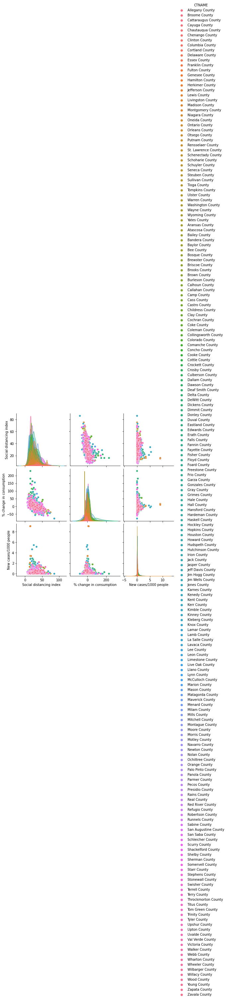

In [173]:
# pairplot with hue day 
sns.pairplot(cluster_4_0_0[social_dist], hue ='CTNAME') 
# to show 
plt.show()

In [ ]:
# pairplot with hue day 
sns.pairplot(cluster_4_0_0[demographic], hue ='CTNAME') 
# to show 
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

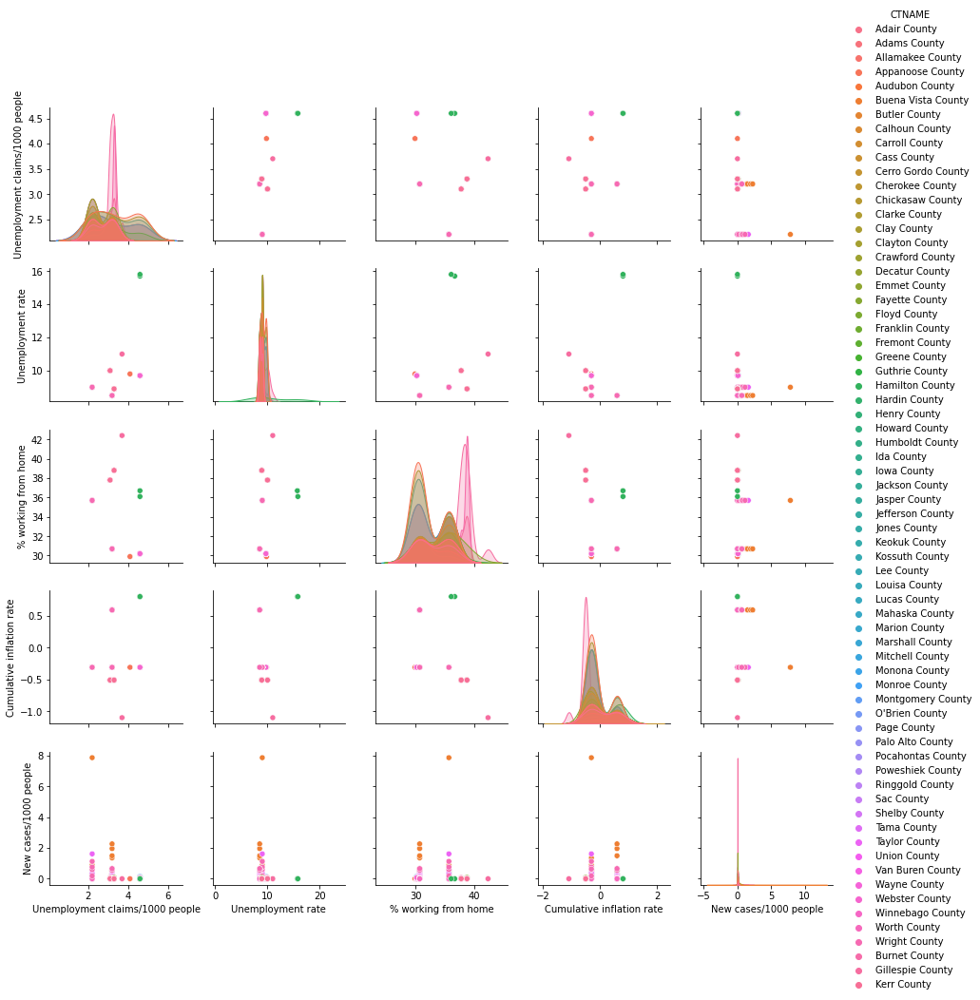

In [ ]:
# pairplot with hue day 
sns.pairplot(cluster_4_0_0[employment], hue ='CTNAME') 
# to show 
plt.show()

### Histogram

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f4a1aea37f0>,
      dtype=object)

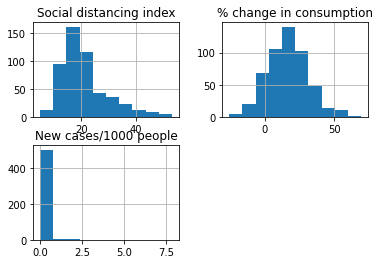

In [ ]:
cluster_4_0_0[social_dist].hist()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f4a1ac3fcc0>,
      dtype=object)

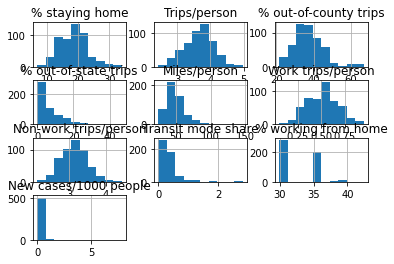

In [ ]:
cluster_4_0_0[mobility].hist()

### Correlation Plot

#### 1.social_dist

In [ ]:
social_dist

['CTNAME',
 'Social distancing index',
 '% change in consumption',
 'New cases/1000 people']

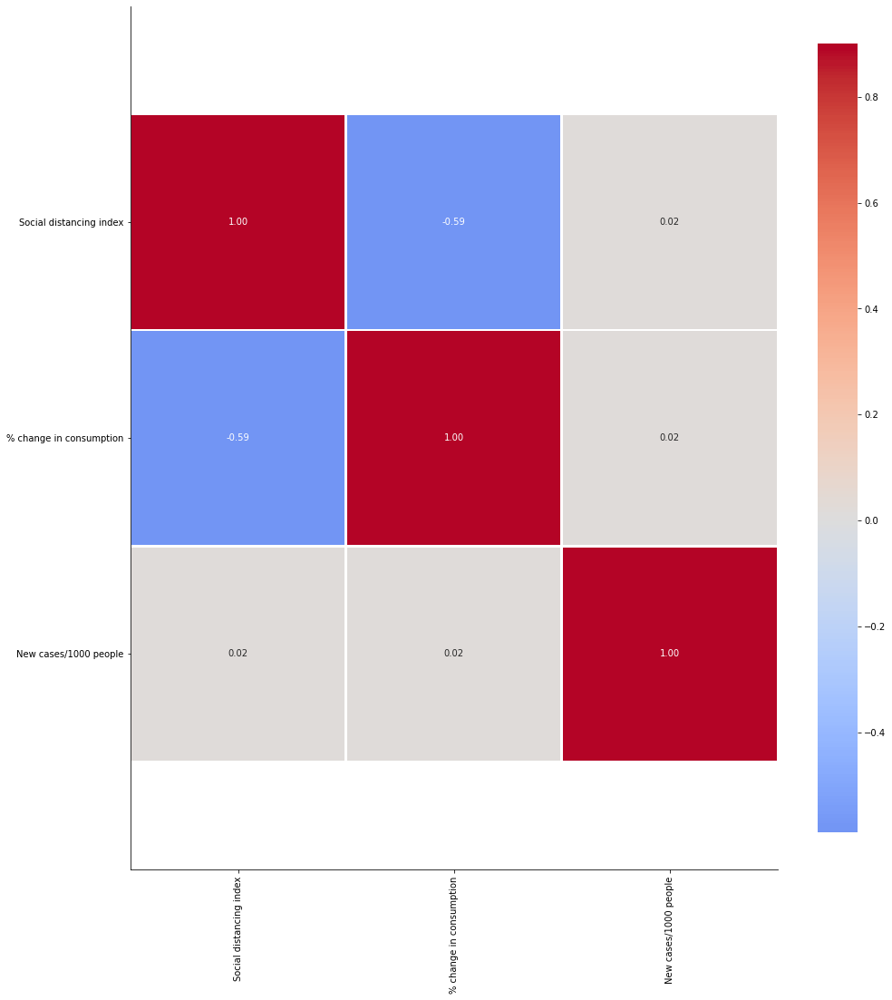

In [ ]:
corr = cluster_4_0_0[social_dist].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

#### 2.mobility

In [ ]:
mobility


['CTNAME',
 '% staying home',
 'Trips/person',
 '% out-of-county trips',
 '% out-of-state trips',
 'Miles/person',
 'Work trips/person',
 'Non-work trips/person',
 'Transit mode share',
 '% working from home',
 'New cases/1000 people']

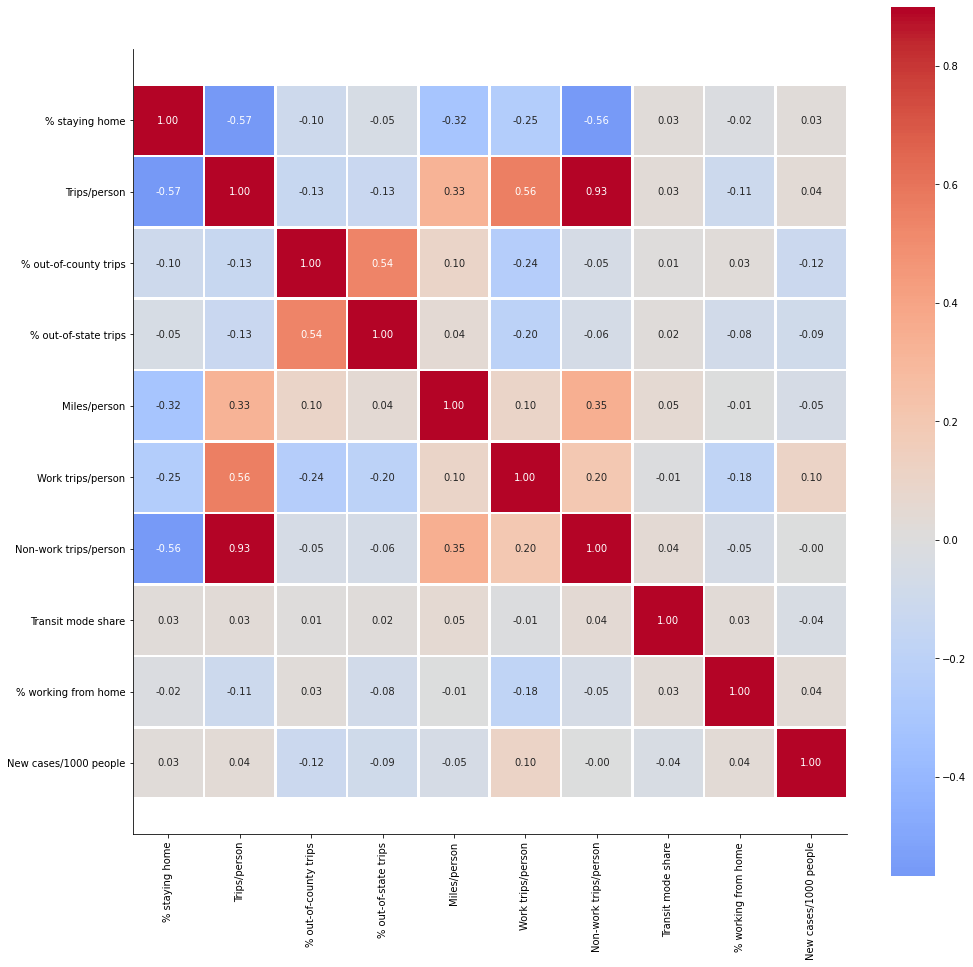

In [ ]:
corr = cluster_4_0_0[mobility].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

#### 3.demographic

In [ ]:
demographic

['CTNAME',
 '% people older than 60',
 'Median income',
 '% African Americans',
 '% Hispanic Americans',
 '% Male',
 'Population density',
 'Employment density',
 '# hot spots/1000 people',
 'Hospital beds/1000 people',
 'ICUs/1000 people',
 '# contact tracing workers/1000 people',
 '% hospital bed utilization',
 'Testing capacity',
 'Tests done/1000 people',
 '% ICU utilization',
 'Ventilator shortage',
 'Imported COVID cases',
 'COVID exposure/1000 people',
 'New cases/1000 people']

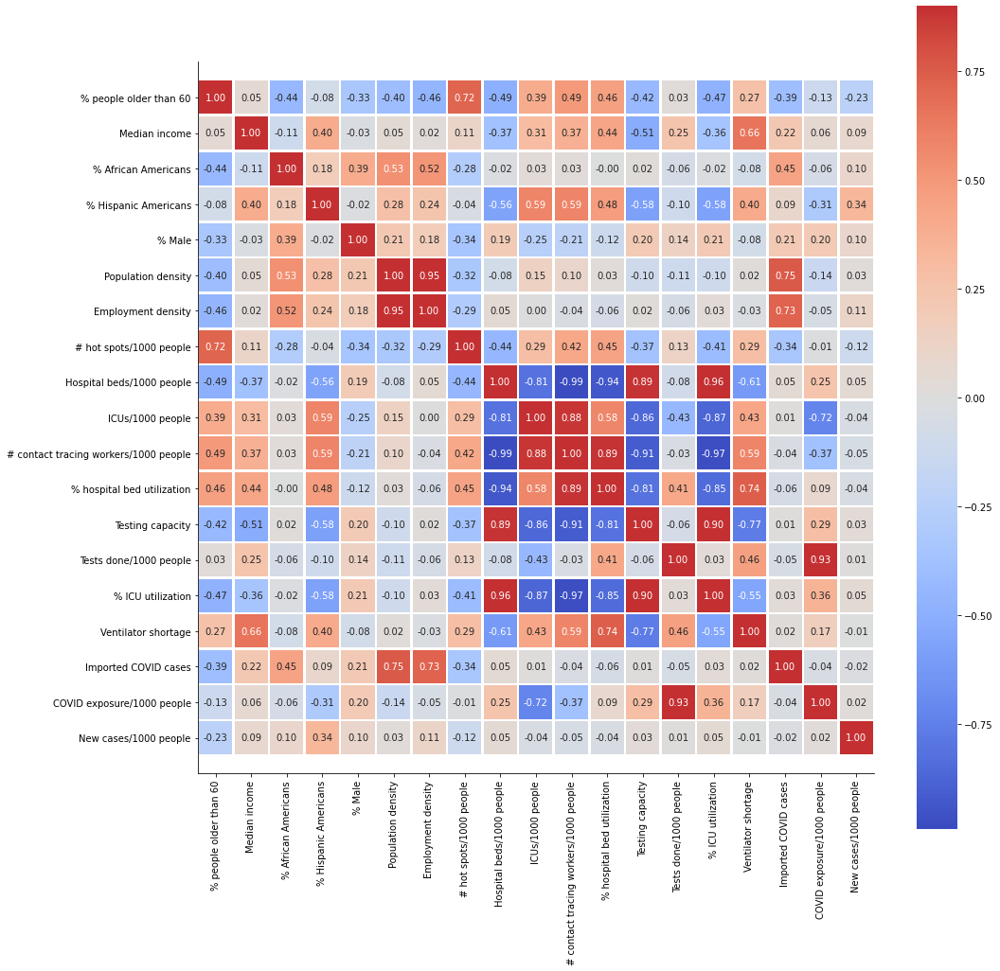

In [ ]:
corr = cluster_4_0_0[demographic].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

#### 4.employment

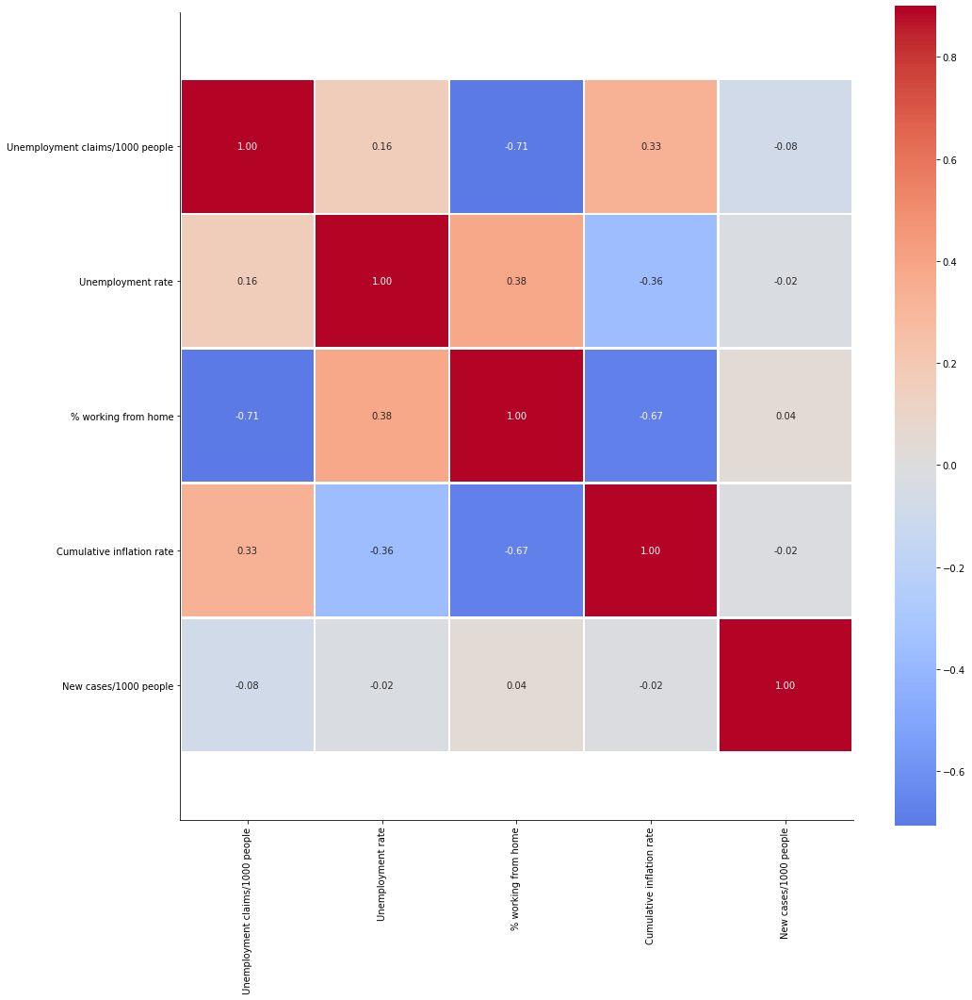

In [ ]:
corr = cluster_4_0_0[employment].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

#### 5.Pos_columns

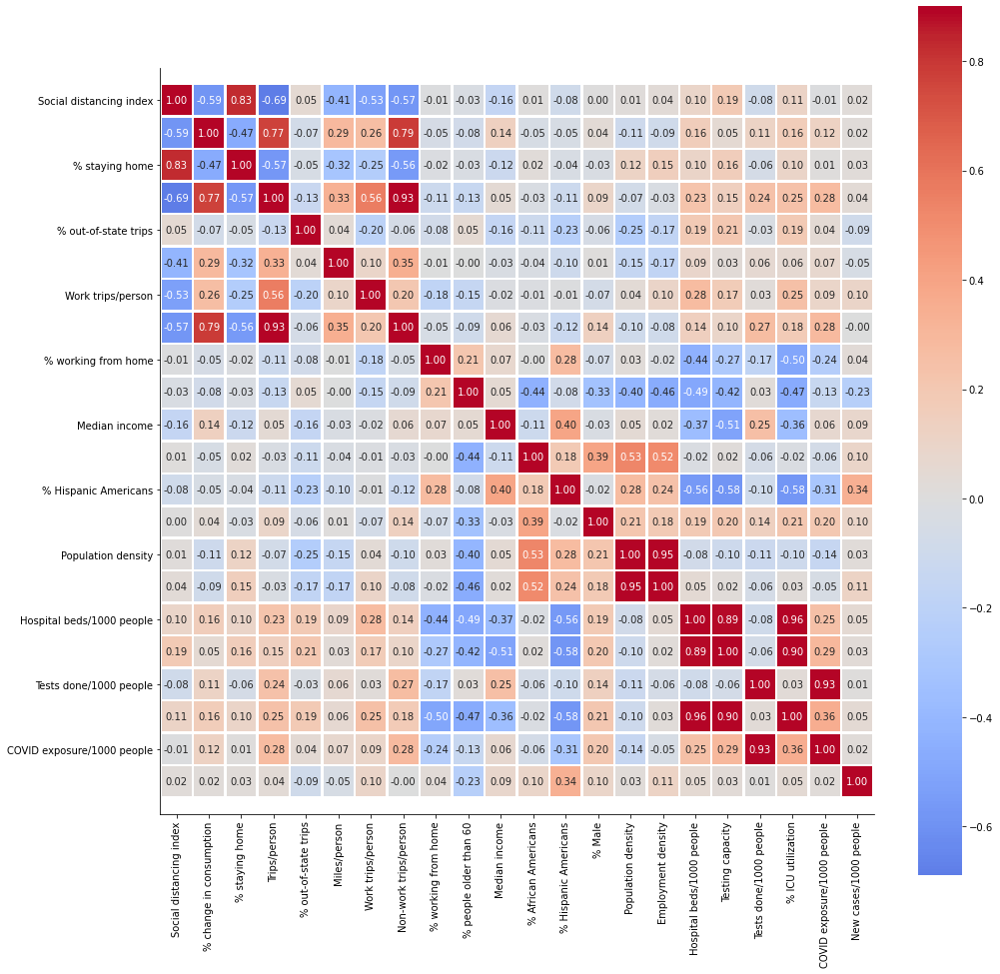

In [ ]:
pos_cor_columns = ['CTNAME','Social distancing index','% change in consumption',
                   '% staying home','Trips/person','% out-of-state trips','Miles/person',
                   'Work trips/person','Non-work trips/person','% working from home',
                   '% people older than 60','Median income','% African Americans', '% Hispanic Americans','% Male','Population density',
                   'Employment density','Hospital beds/1000 people','Testing capacity','Tests done/1000 people',
                   '% ICU utilization','COVID exposure/1000 people',
                    'New cases/1000 people']
corr = cluster_4_0_0[pos_cor_columns].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

## 2.Cluster_0_0_0_1_2



### Different Analysis

In [93]:
maryland_sd_inertia_6states_filtered[maryland_sd_inertia_6states_filtered['cluster_label'] == 'cluster_0_0_0_1_2']['New cases/1000 people'].shape

(512,)

In [94]:
cluster_4= maryland_sd_inertia_6states_filtered[maryland_sd_inertia_6states_filtered['cluster_label'] == 'cluster_0_0_0_1_2']
cluster_4.reset_index(drop=True)

,State,Postal Code,STFIPS,CTFIPS,CTNAME,Social distancing index,% staying home,Trips/person,% out-of-county trips,% out-of-state trips,Miles/person,Work trips/person,Non-work trips/person,New COVID cases,Population,% change in consumption,date,Transit mode share,% people older than 60,Median income,% African Americans,% Hispanic Americans,% Male,Population density,Employment density,# hot spots/1000 people,Hospital beds/1000 people,ICUs/1000 people,# contact tracing workers/1000 people,New cases/1000 people,Active cases/1000 people,#days: decreasing COVID cases,% hospital bed utilization,Testing capacity,Tests done/1000 people,% ICU utilization,Ventilator shortage,Imported COVID cases,COVID exposure/1000 people,#days: decreasing ILI cases,Unemployment claims/1000 people,Unemployment rate,% working from home,Cumulative inflation rate,COVID death rate,cluster,cluster_label
0,Iowa,IA,19,19001,Adair County,21,19,3.22,63.3,15.7,53.9,0.34,2.88,1,7063,-3.4,2020-05-28,0.34,31,51859,0.4,1.9,49.35,12,5,169,3.69,0.26,0.011,0.0472,3.79,0,36.831407,13.0,45.29,13.68,145,54,4.65,112,2.2,9.0,35.7,-0.31,3.45,2,cluster_0_0_0_1_2
1,Iowa,IA,19,19001,Adair County,15,17,3.90,62.8,15.1,61.6,0.39,3.51,1,7063,17.7,2020-05-29,0.34,31,51859,0.4,1.9,49.35,12,5,169,3.69,0.26,0.011,0.0944,3.76,0,36.992604,12.8,46.68,14.29,148,62,4.72,112,2.2,9.0,35.7,-0.31,3.52,2,cluster_0_0_0_1_2
2,Iowa,IA,19,19001,Adair County,30,23,3.48,59.2,17.3,45.4,0.21,3.27,0,7063,9.7,2020-05-30,0.34,31,51859,0.4,1.9,49.35,12,5,169,3.69,0.26,0.011,0.0944,3.76,1,37.145013,12.8,47.66,14.41,152,51,4.80,112,2.2,9.0,35.7,-0.31,3.50,2,cluster_0_0_0_1_2
3,Iowa,IA,19,19001,Adair County,51,30,2.71,63.3,21.8,33.3,0.05,2.67,0,7063,-10.4,2020-05-31,0.34,31,51859,0.4,1.9,49.35,12,5,169,3.69,0.26,0.011,0.0472,3.64,2,37.284553,12.5,49.52,14.16,155,48,4.91,112,3.2,8.5,30.7,-0.31,3.45,2,cluster_0_0_0_1_2
4,Iowa,IA,19,19001,Adair County,21,19,3.17,62.3,13.0,53.0,0.35,2.82,0,7063,-5.4,2020-06-01,0.34,31,51859,0.4,1.9,49.35,12,5,169,3.69,0.26,0.011,0.0000,3.45,3,37.398260,12.4,50.40,15.26,157,47,4.99,112,3.2,8.5,30.7,0.59,3.53,2,cluster_0_0_0_1_2
5,Iowa,IA,19,19001,Adair County,16,18,3.56,61.9,11.6,58.1,0.46,3.10,0,7063,4.0,2020-06-02,0.34,31,51859,0.4,1.9,49.35,12,5,169,3.69,0.26,0.011,0.0000,3.39,4,37.482111,12.2,51.86,13.92,159,53,5.10,119,3.2,8.5,30.7,0.59,3.49,2,cluster_0_0_0_1_2
6,Iowa,IA,19,19001,Adair County,19,18,3.89,60.5,13.0,53.5,0.34,3.55,0,7063,19.1,2020-06-03,0.34,31,51859,0.4,1.9,49.35,12,5,169,3.69,0.26,0.011,0.0000,3.31,5,37.532097,12.2,52.10,14.16,160,52,5.21,119,3.2,8.5,30.7,0.59,3.49,2,cluster_0_0_0_1_2
7,Iowa,IA,19,19003,Adams County,25,26,3.11,47.5,3.7,57.4,0.53,2.58,2,3645,20.9,2020-05-27,0.29,31,49229,0.4,1.3,49.76,9,3,227,3.69,0.26,0.011,0.1829,3.88,0,36.565683,13.2,44.21,13.31,140,14,4.66,112,2.2,9.0,35.7,-0.31,3.37,2,cluster_0_0_0_1_2
8,Iowa,IA,19,19003,Adams County,25,21,2.86,47.4,7.9,42.1,0.32,2.54,0,3645,19.0,2020-05-28,0.29,31,49229,0.4,1.3,49.76,9,3,227,3.69,0.26,0.011,0.1829,3.79,0,36.831407,13.0,45.29,13.68,145,14,4.65,112,2.2,9.0,35.7,-0.31,3.45,2,cluster_0_0_0_1_2
9,Iowa,IA,19,19003,Adams County,18,16,3.49,43.5,5.4,28.7,0.70,2.79,0,3645,30.7,2020-05-29,0.29,31,49229,0.4,1.3,49.76,9,3,227,3.69,0.26,0.011,0.1829,3.76,1,36.992604,12.8,46.68,14.29,148,14,4.72,112,2.2,9.0,35.7,-0.31,3.52,2,cluster_0_0_0_1_2


In [95]:
cluster_4['New cases/1000 people']

79263    0.0472
79264    0.0944
79265    0.0944
79266    0.0472
79267    0.0000
79268    0.0000
79269    0.0000
79270    0.1829
79271    0.1829
79272    0.1829
79273    0.0000
79274    0.0000
79275    0.0000
79276    0.0000
79277    0.0000
79278    0.0241
79279    0.0482
79280    0.0482
79281    0.0241
79282    0.0241
79283    0.0241
79284    0.0241
79285    0.0000
79286    0.0000
79287    0.0268
79288    0.0268
79289    0.0268
79290    0.0000
79291    0.0000
79292    0.0000
79293    0.0268
79294    0.1072
79295    0.1072
79296    0.1072
79297    0.0268
79298    0.0536
79299    0.0268
79300    0.0536
79301    0.0268
79302    0.0268
79303    0.0000
79304    0.0000
79305    0.0804
79306    0.0804
79307    0.0605
79308    0.0605
79309    0.0000
79310    0.0000
79311    0.0000
79312    0.0000
79313    0.0605
79314    0.0605
79315    7.8662
79316    0.8889
79317    1.3586
79318    1.4927
79319    1.9624
79320    2.2643
79321    0.0229
79322    0.0459
79323    0.0459
79324    0.0229
79325   

### States

In [96]:
#states of cluster one

cluster_4.State.unique()


array(['Iowa', 'New York', 'Texas'], dtype=object)

In [97]:
cluster_4.CTNAME.nunique()

68

In [98]:
#states of cluster one

cluster_4.CTNAME.unique()

array(['Adair County', 'Adams County', 'Allamakee County',
       'Appanoose County', 'Audubon County', 'Buena Vista County',
       'Butler County', 'Calhoun County', 'Carroll County', 'Cass County',
       'Cerro Gordo County', 'Cherokee County', 'Chickasaw County',
       'Clarke County', 'Clay County', 'Clayton County',
       'Crawford County', 'Decatur County', 'Emmet County',
       'Fayette County', 'Floyd County', 'Franklin County',
       'Fremont County', 'Greene County', 'Guthrie County',
       'Hamilton County', 'Hardin County', 'Henry County',
       'Howard County', 'Humboldt County', 'Ida County', 'Iowa County',
       'Jackson County', 'Jasper County', 'Jefferson County',
       'Jones County', 'Keokuk County', 'Kossuth County', 'Lee County',
       'Louisa County', 'Lucas County', 'Mahaska County', 'Marion County',
       'Marshall County', 'Mitchell County', 'Monona County',
       'Monroe County', 'Montgomery County', "O'Brien County",
       'Page County', 'Palo A

In [99]:
#min max of new cases by each county of cluster

cluster_4.groupby(['CTNAME']).agg({'New cases/1000 people': ['mean', 'min', 'max']})

New cases/1000 people                
                                    mean     min     max
CTNAME                                                  
Adair County                    0.040457  0.0000  0.0944
Adams County                    0.068587  0.0000  0.1829
Allamakee County                0.027113  0.0000  0.0482
Appanoose County                0.038286  0.0000  0.1072
Audubon County                  0.030250  0.0000  0.0605
Buena Vista County              2.638850  0.8889  7.8662
Burnet County                   0.025220  0.0070  0.0701
Butler County                   0.034400  0.0229  0.0459
Calhoun County                  0.012887  0.0000  0.0687
Carroll County                  0.049600  0.0496  0.0496
Cass County                     0.023210  0.0000  0.1289
Cerro Gordo County              0.019550  0.0078  0.0313
Cherokee County                 0.147240  0.1178  0.2356
Chickasaw County                0.041775  0.0000  0.0557
Clarke County                   0.353738  0.2122  0.5306
Clay County                     0.052600  0.0000  0.1033
Clayton County                  0.035286  0.0000  0.0570
Crawford County                 0.385757  0.0583  0.5245
Decatur County                  0.012660  0.0000  0.0422
Emmet County                    0.128078  0.0000  0.2161
Fayette County                  0.017782  0.0000  0.0789
Floyd County                    0.019200  0.0000  0.0634
Franklin County                 0.093300  0.0329  0.1317
Fremont County                  0.000000  0.0000  0.0000
Gillespie County                0.001033  0.0000  0.0124
Greene County                   0.000000  0.0000  0.0000
Guthrie County                  0.093300  0.0933  0.0933
Hamilton County                 0.141167  0.0000  0.2898
Hardin County                   0.029667  0.0198  0.0593
Henry County                    0.047443  0.0166  0.0997
Howard County                   0.000000  0.0000  0.0000
Humboldt County                 0.079771  0.0349  0.1047
Ida County                      0.000000  0.0000  0.0000
Iowa County                     0.020700  0.0207  0.0207
Jackson County                  0.014317  0.0000  0.0343
Jasper County                   0.026900  0.0269  0.0269
Jefferson County                0.069663  0.0000  0.1995
Jones County                    0.006440  0.0000  0.0161
Keokuk County                   0.016300  0.0000  0.0326
Kerr County                     0.002133  0.0000  0.0064
Kossuth County                  0.044720  0.0000  0.0894
Lee County                      0.020825  0.0098  0.0294
Louisa County                   0.141775  0.0597  0.2388
Lucas County                    0.178325  0.0386  0.3856
Mahaska County                  0.067129  0.0455  0.1061
Marion County                   0.020000  0.0200  0.0200
Marshall County                 0.085743  0.0417  0.1334
Mitchell County                 0.000000  0.0000  0.0000
Monona County                   0.072000  0.0000  0.1920
Monroe County                   0.076078  0.0000  0.2139
Montgomery County               0.026640  0.0000  0.0666
O'Brien County                  0.092900  0.0241  0.1686
Page County                     0.032813  0.0000  0.0656
Palo Alto County                0.063986  0.0000  0.1120
Pocahontas County               0.173088  0.0989  0.3462
Poweshiek County                0.017814  0.0000  0.0357
Ringgold County                 0.000000  0.0000  0.0000
Sac County                      0.111475  0.0686  0.2058
Shelby County                   0.036000  0.0000  0.0864
Tama County                     0.059160  0.0394  0.0986
Taylor County                   0.520467  0.1615  1.6152
Union County                    0.044127  0.0270  0.0809
Van Buren County                0.025909  0.0000  0.0950
Wayne County                    0.000000  0.0000  0.0000
Webster County                  0.044794  0.0000  0.0919
Winnebago County                0.011887  0.0000  0.0317
Worth County                    0.000000  0.0000  0.0000
Wright County                

In [100]:
cluster_4.describe().T

,count,mean,std,min,25%,50%,75%,max
STFIPS,512.0,20.312500,5.967623,19.000000,19.000000,19.000000,19.000000,48.000000
CTFIPS,512.0,20413.800781,5978.483437,19001.000000,19053.000000,19105.000000,19157.500000,48265.000000
Social distancing index,512.0,20.953125,8.466681,5.000000,15.000000,19.000000,24.250000,53.000000
% staying home,512.0,18.763672,4.345275,7.000000,16.000000,19.000000,21.250000,34.000000
Trips/person,512.0,3.659590,0.434666,2.440000,3.380000,3.700000,3.950000,4.970000
% out-of-county trips,512.0,37.410742,7.769861,21.600000,32.100000,36.700000,42.225000,66.800000
% out-of-state trips,512.0,6.516602,7.023866,0.100000,1.300000,4.100000,9.425000,46.600000
Miles/person,512.0,49.722461,14.823546,24.800000,39.800000,47.300000,56.000000,146.300000
Work trips/person,512.0,0.506387,0.167400,0.050000,0.370000,0.510000,0.620000,0.950000
Non-work trips/person,512.0,3.153262,0.368237,2.130000,2.900000,3.140000,3.390000,4.440000


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


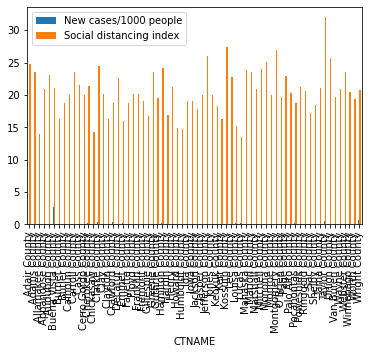

In [101]:
cluster_4.groupby("CTNAME")['New cases/1000 people', 'Social distancing index'].mean().plot(kind='bar')

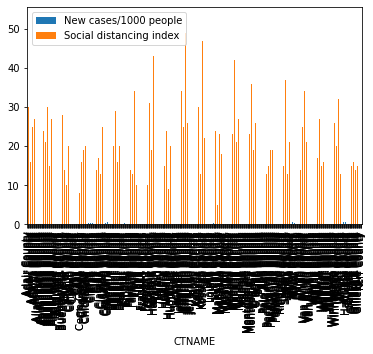

In [102]:
cluster_4.plot(x="CTNAME", y=['New cases/1000 people', 'Social distancing index'], kind="bar")

In [103]:
## Min value of all column

cluster_4.min(axis=0) # will return min value of each column

State                                                 Iowa
Postal Code                                             IA
STFIPS                                                  19
CTFIPS                                               19001
CTNAME                                        Adair County
Social distancing index                                  5
% staying home                                           7
Trips/person                                          2.44
% out-of-county trips                                 21.6
% out-of-state trips                                   0.1
Miles/person                                          24.8
Work trips/person                                     0.05
Non-work trips/person                                 2.13
New COVID cases                                          0
Population                                            3645
% change in consumption                              -25.6
date                                            2020-05-

In [104]:
## Max value of all column

cluster_4.max(axis=0) # will return max value of each column

State                                                Texas
Postal Code                                             TX
STFIPS                                                  48
CTFIPS                                               48265
CTNAME                                       Wright County
Social distancing index                                 53
% staying home                                          34
Trips/person                                          4.97
% out-of-county trips                                 66.8
% out-of-state trips                                  46.6
Miles/person                                         146.3
Work trips/person                                     0.95
Non-work trips/person                                 4.44
New COVID cases                                         66
Population                                           52405
% change in consumption                               69.6
date                                            2020-06-

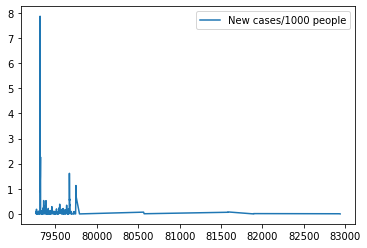

In [105]:
cluster_4[['date','New cases/1000 people']].plot()

In [106]:
cluster_4['date'].unique()

array(['2020-05-28', '2020-05-29', '2020-05-30', '2020-05-31',
       '2020-06-01', '2020-06-02', '2020-06-03', '2020-05-27',
       '2020-05-16', '2020-05-17', '2020-05-18', '2020-05-19',
       '2020-05-20', '2020-05-21', '2020-05-22', '2020-05-23',
       '2020-05-24', '2020-05-25', '2020-05-26', '2020-06-04',
       '2020-06-05', '2020-06-20', '2020-06-21', '2020-06-09',
       '2020-06-10', '2020-06-11', '2020-06-12', '2020-06-08',
       '2020-06-13'], dtype=object)

(array([-0.06, -0.04, -0.02,  0.  ,  0.02,  0.04,  0.06]),
 <a list of 7 Text major ticklabel objects>)

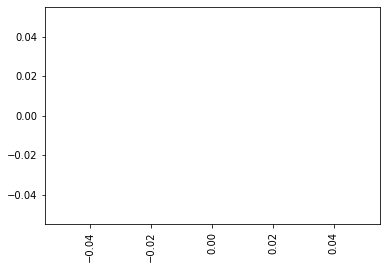

In [107]:
plt.figure()

date_list = ['2020-10-01', '2020-10-02',
       '2020-10-03', '2020-10-04', '2020-10-05', '2020-10-06',
       '2020-10-07', '2020-10-08', '2020-10-09', '2020-10-10',
       '2020-10-11', '2020-10-12', '2020-10-13']

filter_data = cluster_4[cluster_4['date'].isin(date_list)]
x = filter_data['date']
y1 = filter_data['New cases/1000 people'] 
y2 = filter_data['Social distancing index']


plt.plot(x,y1)
plt.plot(x,y2)
plt.xticks(rotation=90)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:908: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


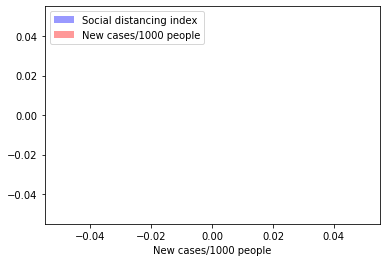

In [108]:
# Method 1: on the same Axis
date_list = ['2020-10-01', '2020-10-02',
       '2020-10-03', '2020-10-04', '2020-10-05', '2020-10-06',
       '2020-10-07', '2020-10-08', '2020-10-09', '2020-10-10',
       '2020-10-11', '2020-10-12', '2020-10-13']

filter_data = cluster_4[cluster_4['date'].isin(date_list)]

sns.distplot( (filter_data['Social distancing index']) , color="blue", label='Social distancing index')
sns.distplot( filter_data['New cases/1000 people'] , color="red", label='New cases/1000 people')
plt.legend()
 
plt.show()

New case for each county

(array([-5.,  0.,  5., 10., 15., 20., 25., 30.]),
 <a list of 8 Text major ticklabel objects>)

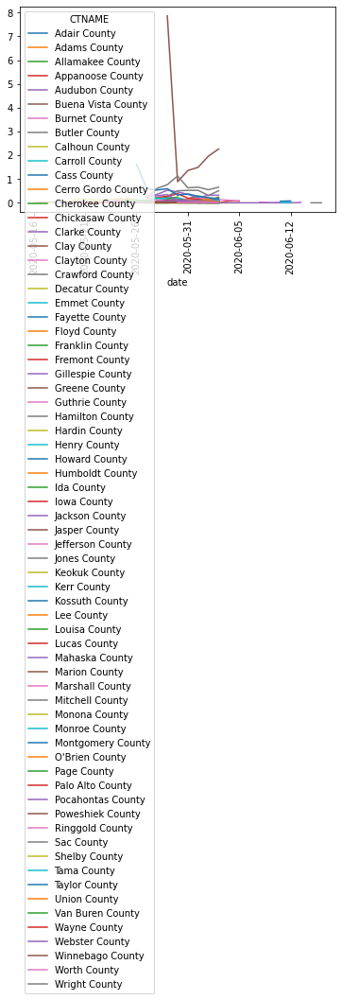

In [109]:
cluster_4.pivot(index='date', columns='CTNAME', values='New cases/1000 people').plot()
plt.xticks(rotation=90)

In [112]:
# Method 1: on the same Axis - NOT WORKING NOW
date_list = ['2020-10-01', '2020-10-02',
       '2020-10-03', '2020-10-04', '2020-10-05', '2020-10-06',
       '2020-10-07', '2020-10-08', '2020-10-09', '2020-10-10',
       '2020-10-11', '2020-10-12', '2020-10-13']

#filter_data = cluster_4[cluster_4['date'].isin(date_list)]
#filter_data.pivot(index='date', columns='CTNAME', values='New cases/1000 people').plot()
#plt.xticks(rotation=90)

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
 <a list of 6 Text major ticklabel objects>)

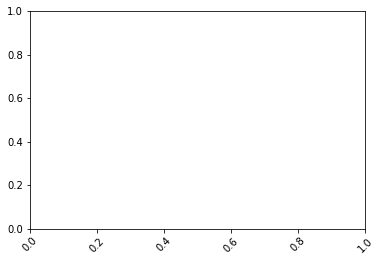

In [113]:
sns.lineplot(data=filter_data, hue='CTNAME', x='date', y='New cases/1000 people')
plt.xticks(rotation=45)

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
 <a list of 6 Text major ticklabel objects>)

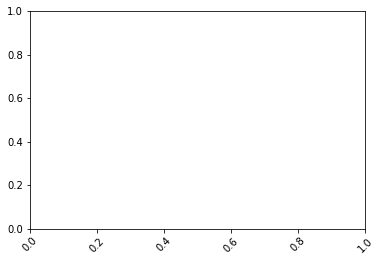

In [114]:
sns.lineplot(data=filter_data, hue='CTNAME', x='date', y='Social distancing index')
plt.xticks(rotation=45)

### Pairplot- All Column

In [115]:
# pairplot with hue day 
#sns.pairplot(cluster_4, hue ='CTNAME') 
# to show 
#plt.show()

### Group Columns

In [116]:
cluster_4.columns

Index(['State', 'Postal Code', 'STFIPS', 'CTFIPS', 'CTNAME',
       'Social distancing index', '% staying home', 'Trips/person',
       '% out-of-county trips', '% out-of-state trips', 'Miles/person',
       'Work trips/person', 'Non-work trips/person', 'New COVID cases',
       'Population', '% change in consumption', 'date', 'Transit mode share',
       '% people older than 60', 'Median income', '% African Americans',
       '% Hispanic Americans', '% Male', 'Population density',
       'Employment density', '# hot spots/1000 people',
       'Hospital beds/1000 people', 'ICUs/1000 people',
       '# contact tracing workers/1000 people', 'New cases/1000 people',
       'Active cases/1000 people', '#days: decreasing COVID cases',
       '% hospital bed utilization', 'Testing capacity',
       'Tests done/1000 people', '% ICU utilization', 'Ventilator shortage',
       'Imported COVID cases', 'COVID exposure/1000 people',
       '#days: decreasing ILI cases', 'Unemployment claims/1000 p

In [117]:
filter_col= ['Social distancing index','% staying home', 'Trips/person', '% out-of-county trips',
       '% out-of-state trips', 'Miles/person', 'Work trips/person',
       'Non-work trips/person','% change in consumption','Transit mode share',
       '% people older than 60', 'Median income', '% African Americans',
       '% Hispanic Americans', '% Male', 'Population density',
       'Employment density', '# hot spots/1000 people',
       'Hospital beds/1000 people', 'ICUs/1000 people',
       '# contact tracing workers/1000 people','% hospital bed utilization', 'Testing capacity',
       'Tests done/1000 people', '% ICU utilization', 'Ventilator shortage',
       'Imported COVID cases', 'COVID exposure/1000 people',
       '#days: decreasing ILI cases', 'Unemployment claims/1000 people',
       'Unemployment rate', '% working from home', 'Cumulative inflation rate','New cases/1000 people']

social_dist= ['CTNAME','Social distancing index','% change in consumption', 'New cases/1000 people']

mobility = ['CTNAME','% staying home', 'Trips/person', '% out-of-county trips',
       '% out-of-state trips', 'Miles/person', 'Work trips/person',
       'Non-work trips/person','Transit mode share',
       '% working from home', 'New cases/1000 people']

demographic = ['CTNAME','% people older than 60', 'Median income', '% African Americans',
       '% Hispanic Americans', '% Male', 'Population density',
       'Employment density','# hot spots/1000 people',
       'Hospital beds/1000 people', 'ICUs/1000 people',
       '# contact tracing workers/1000 people','% hospital bed utilization', 'Testing capacity',
       'Tests done/1000 people', '% ICU utilization', 'Ventilator shortage',
       'Imported COVID cases', 'COVID exposure/1000 people','New cases/1000 people']

employment = ['CTNAME','Unemployment claims/1000 people',
       'Unemployment rate', '% working from home', 'Cumulative inflation rate','New cases/1000 people']

### Pairplot- Using Column Groups 

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

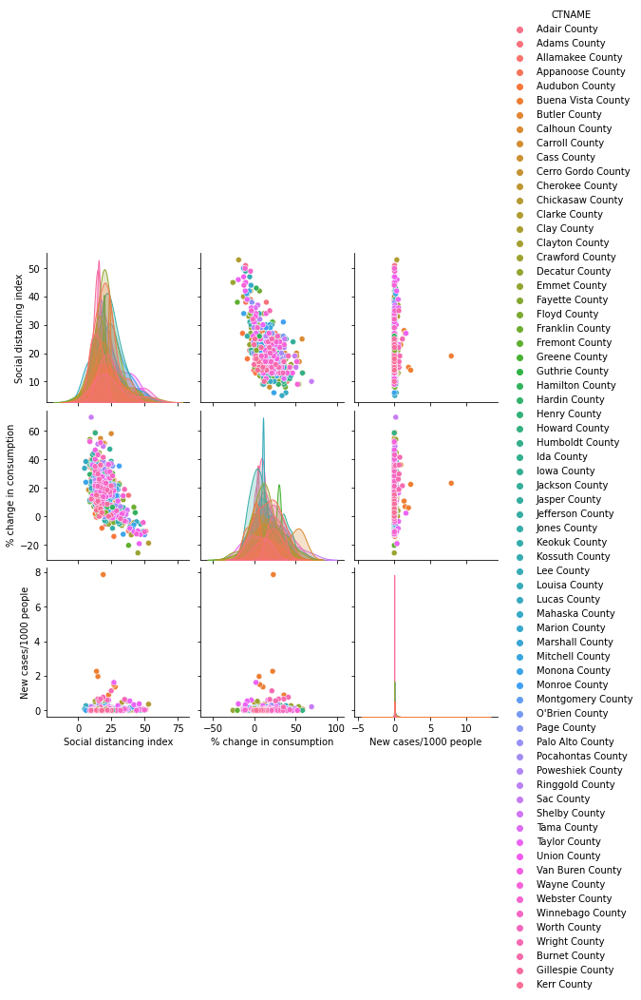

In [120]:
# pairplot with hue day 
sns.pairplot(cluster_4[social_dist], hue ='CTNAME') 
# to show 
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

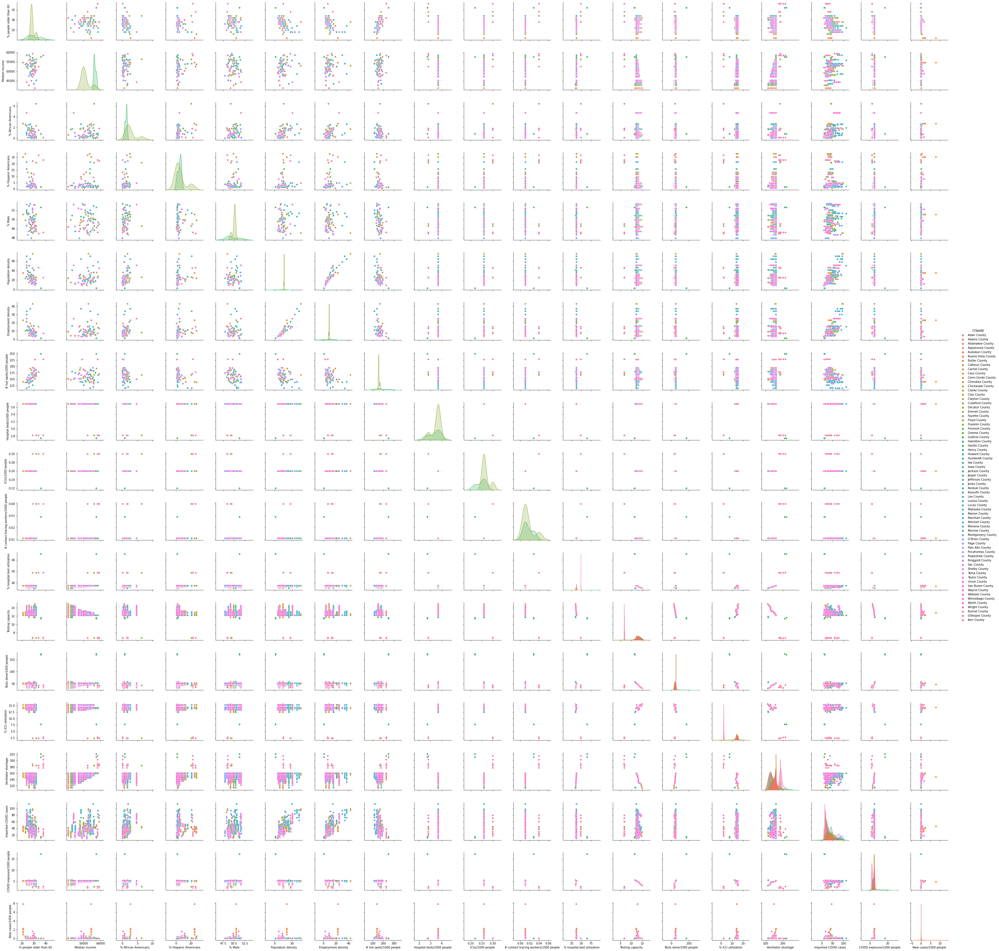

In [121]:
# pairplot with hue day 
sns.pairplot(cluster_4[demographic], hue ='CTNAME') 
# to show 
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

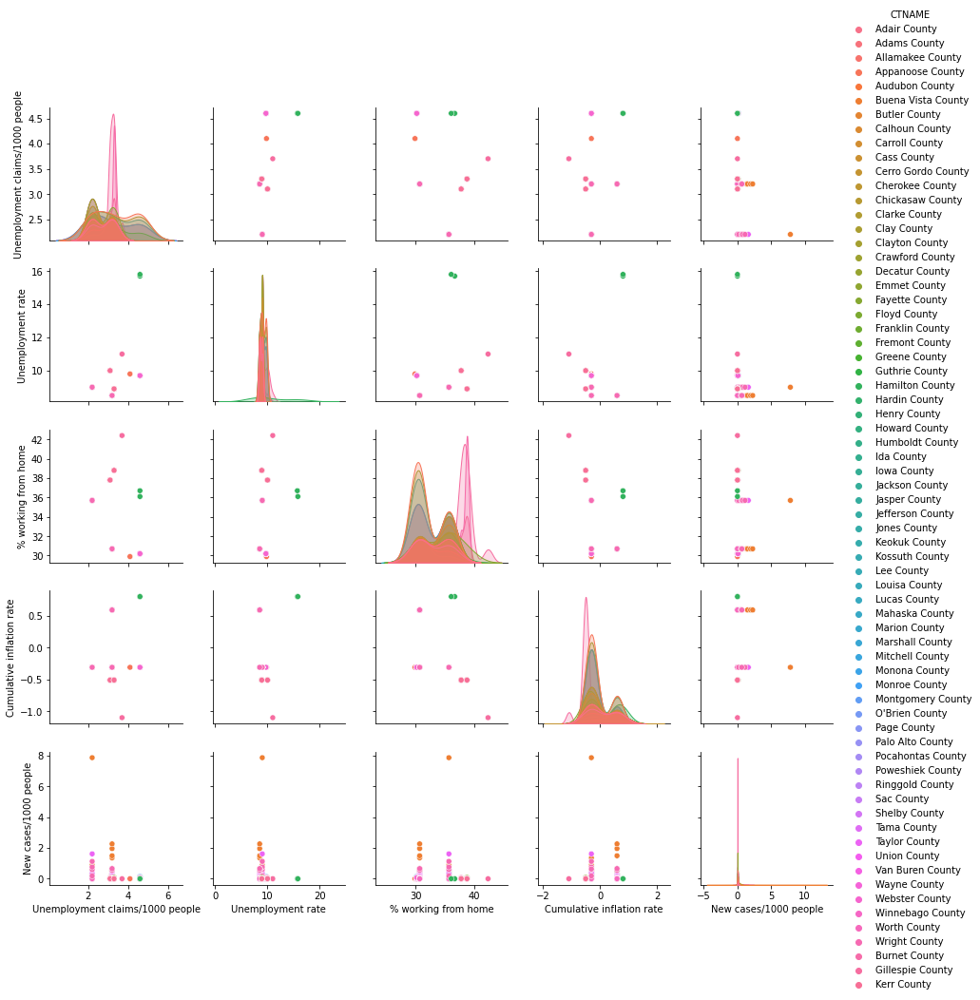

In [122]:
# pairplot with hue day 
sns.pairplot(cluster_4[employment], hue ='CTNAME') 
# to show 
plt.show()

### Histogram

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f4a1aea37f0>,
      dtype=object)

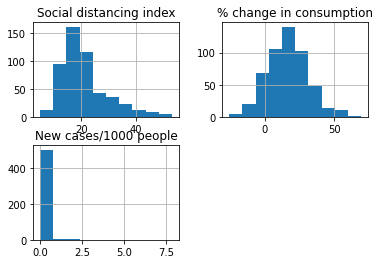

In [123]:
cluster_4[social_dist].hist()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f4a1ac3fcc0>,
      dtype=object)

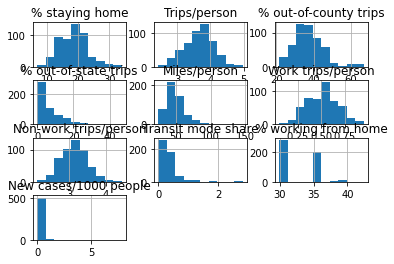

In [134]:
cluster_4[mobility].hist()

### Correlation Plot

#### 1.social_dist

In [145]:
social_dist

['CTNAME',
 'Social distancing index',
 '% change in consumption',
 'New cases/1000 people']

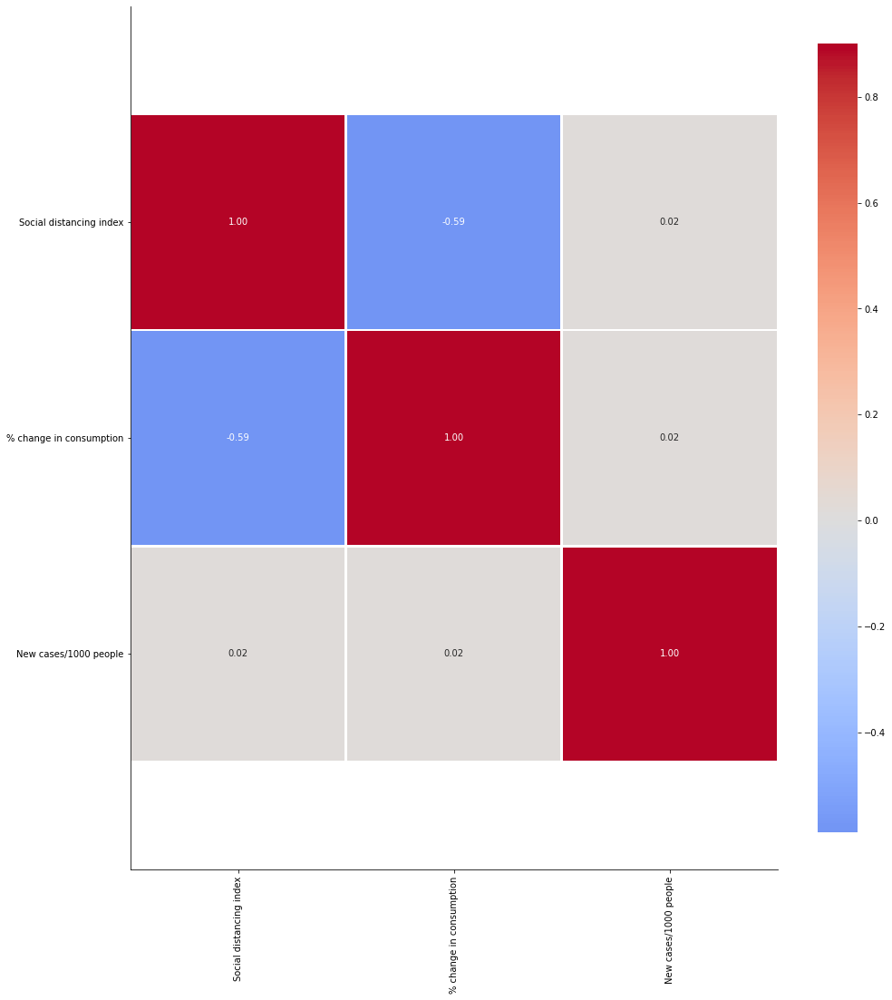

In [124]:
corr = cluster_4[social_dist].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

#### 2.mobility

In [147]:
mobility


['CTNAME',
 '% staying home',
 'Trips/person',
 '% out-of-county trips',
 '% out-of-state trips',
 'Miles/person',
 'Work trips/person',
 'Non-work trips/person',
 'Transit mode share',
 '% working from home',
 'New cases/1000 people']

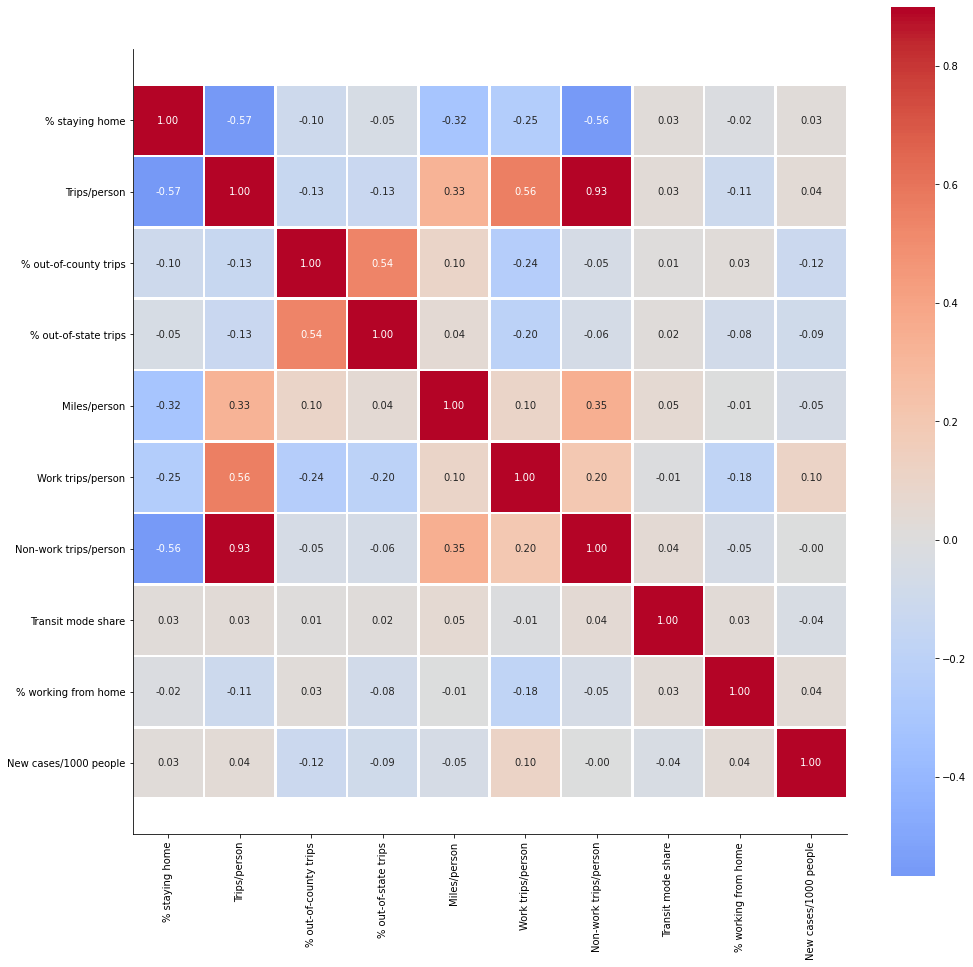

In [125]:
corr = cluster_4[mobility].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

#### 3.demographic

In [151]:
demographic

['CTNAME',
 '% people older than 60',
 'Median income',
 '% African Americans',
 '% Hispanic Americans',
 '% Male',
 'Population density',
 'Employment density',
 '# hot spots/1000 people',
 'Hospital beds/1000 people',
 'ICUs/1000 people',
 '# contact tracing workers/1000 people',
 '% hospital bed utilization',
 'Testing capacity',
 'Tests done/1000 people',
 '% ICU utilization',
 'Ventilator shortage',
 'Imported COVID cases',
 'COVID exposure/1000 people',
 'New cases/1000 people']

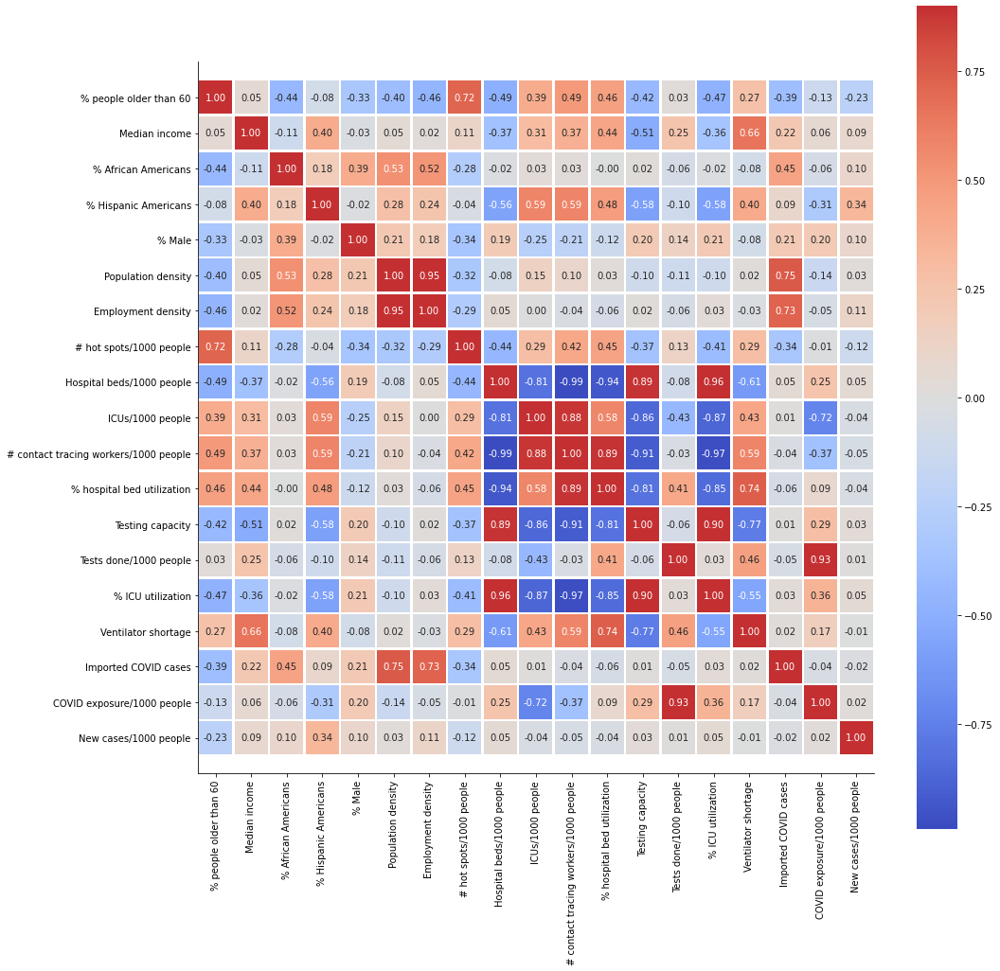

In [126]:
corr = cluster_4[demographic].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

#### 4.employment

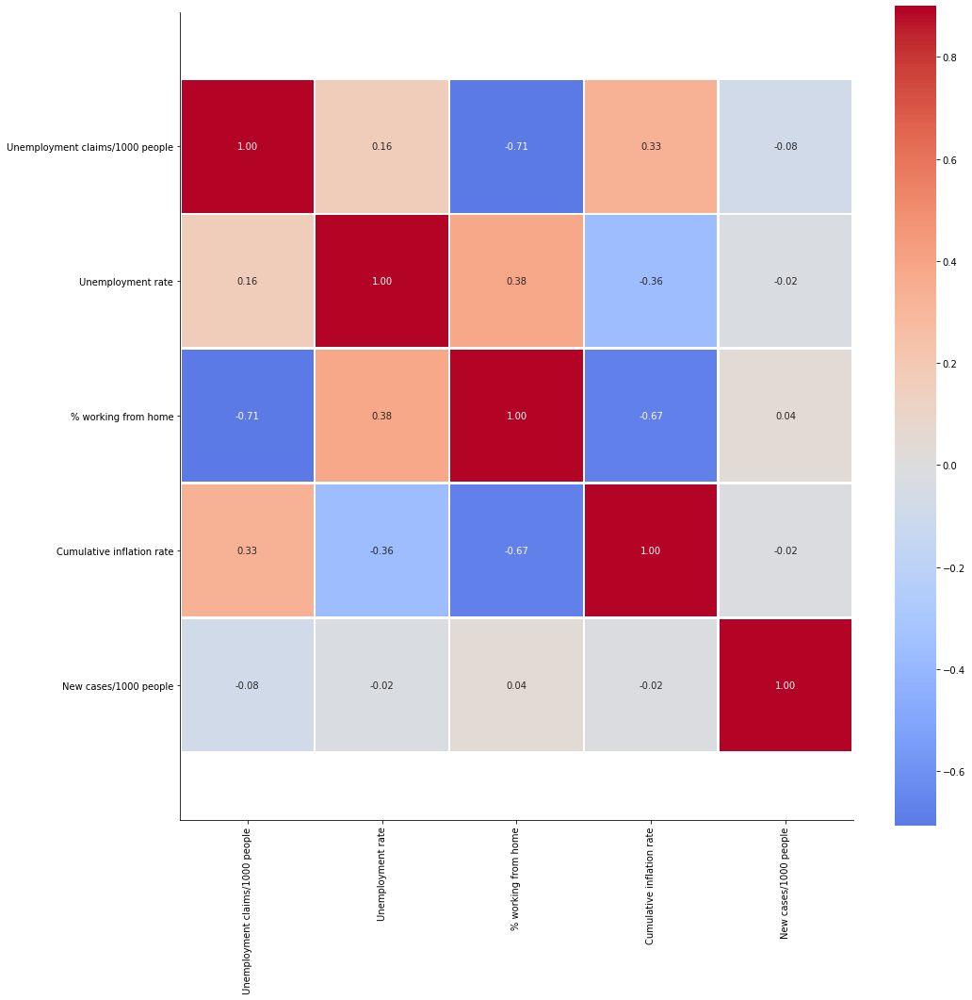

In [127]:
corr = cluster_4[employment].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

#### 5.Pos_columns

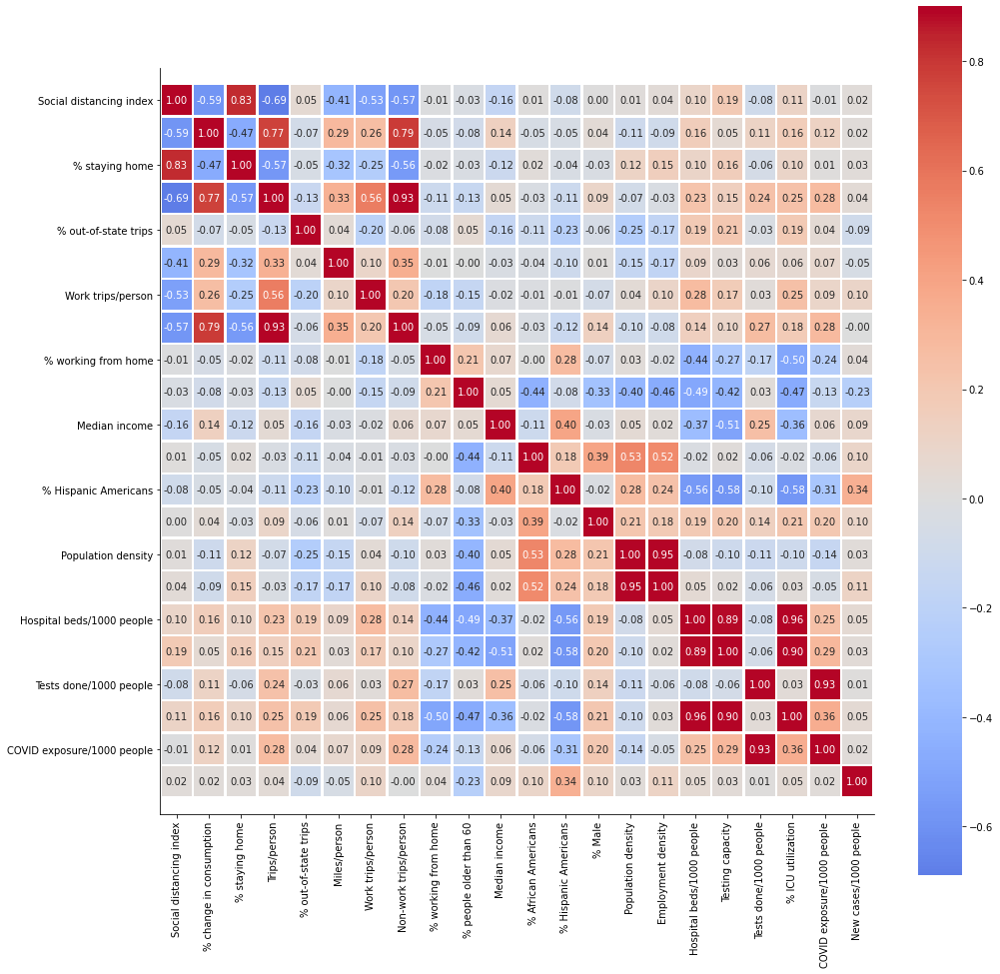

In [161]:
pos_cor_columns = ['CTNAME','Social distancing index','% change in consumption',
                   '% staying home','Trips/person','% out-of-state trips','Miles/person',
                   'Work trips/person','Non-work trips/person','% working from home',
                   '% people older than 60','Median income','% African Americans', '% Hispanic Americans','% Male','Population density',
                   'Employment density','Hospital beds/1000 people','Testing capacity','Tests done/1000 people',
                   '% ICU utilization','COVID exposure/1000 people',
                    'New cases/1000 people']
corr = cluster_4[pos_cor_columns].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

## Cluster_1

From analysis: Here one county is forming a cluster. That county is 'New York County'

In [40]:
maryland_sd_inertia_6states_filtered[maryland_sd_inertia_6states_filtered['cluster_label'] == 'cluster_1']['New cases/1000 people'].shape

(574,)

In [41]:
cluster_1= maryland_sd_inertia_6states_filtered[maryland_sd_inertia_6states_filtered['cluster_label'] == 'cluster_1']
cluster_1.reset_index(drop=True)

,State,Postal Code,STFIPS,CTFIPS,CTNAME,Social distancing index,% staying home,Trips/person,% out-of-county trips,% out-of-state trips,Miles/person,Work trips/person,Non-work trips/person,New COVID cases,Population,% change in consumption,date,Transit mode share,% people older than 60,Median income,% African Americans,% Hispanic Americans,% Male,Population density,Employment density,# hot spots/1000 people,Hospital beds/1000 people,ICUs/1000 people,# contact tracing workers/1000 people,New cases/1000 people,Active cases/1000 people,#days: decreasing COVID cases,% hospital bed utilization,Testing capacity,Tests done/1000 people,% ICU utilization,Ventilator shortage,Imported COVID cases,COVID exposure/1000 people,#days: decreasing ILI cases,Unemployment claims/1000 people,Unemployment rate,% working from home,Cumulative inflation rate,COVID death rate,cluster,cluster_label
0,New York,NY,36,36005,Bronx County,65,49,2.24,41.1,4.9,16.4,0.35,1.88,0,1432132,-32.5,2020-01-01,59.89,17,38085,29.3,55.9,47.08,25037,5122,65,2.74,0.22,0.029,0.0000,0.00,0,63.500000,0.0,0.00,0.00,0,0,0.00,0,2.3,3.8,4.2,0.7,0.00,1,cluster_1
1,New York,NY,36,36005,Bronx County,29,32,3.45,40.1,3.2,22.0,0.69,2.76,0,1432132,-0.9,2020-01-02,59.89,17,38085,29.3,55.9,47.08,25037,5122,65,2.74,0.22,0.029,0.0000,0.00,0,63.500000,0.0,0.00,0.00,0,0,0.00,0,2.3,3.8,4.2,0.7,0.00,1,cluster_1
2,New York,NY,36,36005,Bronx County,27,32,3.56,39.7,3.5,22.4,0.71,2.85,0,1432132,2.4,2020-01-03,59.89,17,38085,29.3,55.9,47.08,25037,5122,65,2.74,0.22,0.029,0.0000,0.00,0,63.500000,0.0,0.00,0.00,0,0,0.00,0,2.3,3.8,4.2,0.7,0.00,1,cluster_1
3,New York,NY,36,36005,Bronx County,49,41,2.98,39.4,4.2,19.9,0.42,2.56,0,1432132,-8.1,2020-01-04,59.89,17,38085,29.3,55.9,47.08,25037,5122,65,2.74,0.22,0.029,0.0000,0.00,0,63.500000,0.0,0.00,0.00,0,0,0.00,0,2.3,3.8,4.2,0.7,0.00,1,cluster_1
4,New York,NY,36,36005,Bronx County,60,48,2.53,39.4,4.0,19.7,0.36,2.17,0,1432132,-22.1,2020-01-05,59.89,17,38085,29.3,55.9,47.08,25037,5122,65,2.74,0.22,0.029,0.0000,0.00,0,63.500000,0.0,0.00,0.00,0,0,0.00,0,1.2,3.8,4.2,0.7,0.00,1,cluster_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
569,New York,NY,36,36047,Kings County,72,44,2.79,30.1,3.5,37.4,0.45,2.34,300,2582830,-17.3,2020-10-09,61.36,19,56015,30.3,19.2,47.37,26839,6363,103,2.74,0.22,0.029,0.1091,1.55,0,64.944676,4.0,603.14,3.91,86,1774,18.08,196,3.4,18.6,22.4,1.3,9.42,1,cluster_1
570,New York,NY,36,36047,Kings County,72,45,2.77,29.4,4.2,40.4,0.33,2.44,236,2582830,-13.7,2020-10-10,61.36,19,56015,30.3,19.2,47.37,26839,6363,103,2.74,0.22,0.029,0.1057,1.58,0,64.968286,4.0,610.03,4.16,88,1770,18.08,196,3.4,18.6,22.4,1.3,9.42,1,cluster_1
571,New York,NY,36,36047,Kings County,62,49,2.43,29.7,5.0,39.7,0.46,1.97,200,2582830,-30.4,2020-10-11,61.36,19,56015,30.3,19.2,47.37,26839,6363,103,2.74,0.22,0.029,0.0950,1.60,0,64.992948,3.9,616.08,4.32,89,1666,18.08,196,3.4,18.6,22.4,1.3,9.42,1,cluster_1
572,New York,NY,36,36047,Kings County,63,50,2.25,31.7,4.3,35.9,0.48,1.77,121,2582830,-37.4,2020-10-12,61.36,19,56015,30.3,19.2,47.37,26839,6363,103,2.74,0.22,0.029,0.0719,1.61,1,65.018630,3.9,620.78,4.30,91,1649,18.08,196,3.4,18.6,22.4,1.3,9.42,1,cluster_1


In [42]:
cluster_1['New cases/1000 people']

0      0.0000
1      0.0000
2      0.0000
3      0.0000
4      0.0000
        ...  
569    0.1091
570    0.1057
571    0.0950
572    0.0719
573    0.0653
Name: New cases/1000 people, Length: 574, dtype: float64

In [43]:
cluster_1.head(2)

,State,Postal Code,STFIPS,CTFIPS,CTNAME,Social distancing index,% staying home,Trips/person,% out-of-county trips,% out-of-state trips,Miles/person,Work trips/person,Non-work trips/person,New COVID cases,Population,% change in consumption,date,Transit mode share,% people older than 60,Median income,% African Americans,% Hispanic Americans,% Male,Population density,Employment density,# hot spots/1000 people,Hospital beds/1000 people,ICUs/1000 people,# contact tracing workers/1000 people,New cases/1000 people,Active cases/1000 people,#days: decreasing COVID cases,% hospital bed utilization,Testing capacity,Tests done/1000 people,% ICU utilization,Ventilator shortage,Imported COVID cases,COVID exposure/1000 people,#days: decreasing ILI cases,Unemployment claims/1000 people,Unemployment rate,% working from home,Cumulative inflation rate,COVID death rate,cluster,cluster_label
0,New York,NY,36,36005,Bronx County,65,49,2.24,41.1,4.9,16.4,0.35,1.88,0,1432132,-32.5,2020-01-01,59.89,17,38085,29.3,55.9,47.08,25037,5122,65,2.74,0.22,0.029,0.0,0.0,0,63.5,0.0,0.0,0.0,0,0,0.0,0,2.3,3.8,4.2,0.7,0.0,1,cluster_1
1,New York,NY,36,36005,Bronx County,29,32,3.45,40.1,3.2,22.0,0.69,2.76,0,1432132,-0.9,2020-01-02,59.89,17,38085,29.3,55.9,47.08,25037,5122,65,2.74,0.22,0.029,0.0,0.0,0,63.5,0.0,0.0,0.0,0,0,0.0,0,2.3,3.8,4.2,0.7,0.0,1,cluster_1


### States

In [44]:
#states of cluster one

cluster_1.State.unique()


array(['New York'], dtype=object)

In [143]:
cluster_1.CTNAME.nunique()

2

In [142]:
cluster_1.CTNAME.unique()

array(['Bronx County', 'Kings County'], dtype=object)

In [45]:
#min max of new cases by group

cluster_1.groupby(['CTNAME']).agg({'New cases/1000 people': ['mean', 'min', 'max']})

New cases/1000 people             
                              mean  min     max
CTNAME                                         
Bronx County              0.007321  0.0  0.0510
Kings County              0.010575  0.0  0.1124

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


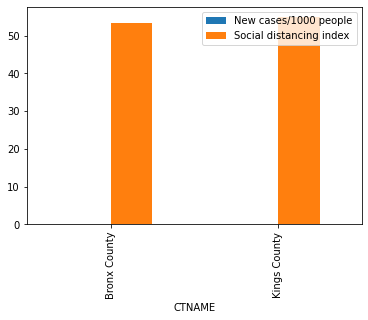

In [46]:
cluster_1.groupby(["CTNAME"])['New cases/1000 people', 'Social distancing index'].mean().plot(kind='bar')

In [47]:
## Min value of all column

cluster_1.min(axis=0) # will return min value of each column

State                                        New York
Postal Code                                        NY
STFIPS                                             36
CTFIPS                                          36005
CTNAME                                   Bronx County
Social distancing index                            22
% staying home                                     28
Trips/person                                     1.48
% out-of-county trips                            21.7
% out-of-state trips                              1.8
Miles/person                                      8.4
Work trips/person                                0.25
Non-work trips/person                            1.23
New COVID cases                                     0
Population                                    1432132
% change in consumption                         -55.8
date                                       2020-01-01
Transit mode share                              59.89
% people older than 60      

In [48]:
## Max value of all column

cluster_1.max(axis=0) # will return max value of each column

State                                        New York
Postal Code                                        NY
STFIPS                                             36
CTFIPS                                          36047
CTNAME                                   Kings County
Social distancing index                            87
% staying home                                     71
Trips/person                                     3.99
% out-of-county trips                            42.2
% out-of-state trips                              7.4
Miles/person                                     69.1
Work trips/person                                0.82
Non-work trips/person                            3.28
New COVID cases                                   358
Population                                    2582830
% change in consumption                          17.8
date                                       2020-10-13
Transit mode share                              61.36
% people older than 60      

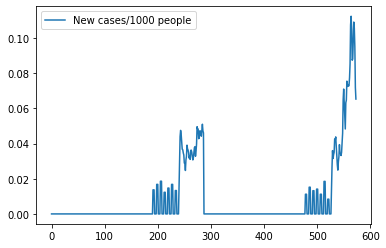

In [49]:
cluster_1[['date','New cases/1000 people']].plot()

In [50]:
cluster_1['date'].unique()

array(['2020-01-01', '2020-01-02', '2020-01-03', '2020-01-04',
       '2020-01-05', '2020-01-06', '2020-01-07', '2020-01-08',
       '2020-01-09', '2020-01-10', '2020-01-11', '2020-01-12',
       '2020-01-13', '2020-01-14', '2020-01-15', '2020-01-16',
       '2020-01-17', '2020-01-18', '2020-01-19', '2020-01-20',
       '2020-01-21', '2020-01-22', '2020-01-23', '2020-01-24',
       '2020-01-25', '2020-01-26', '2020-01-27', '2020-01-28',
       '2020-01-29', '2020-01-30', '2020-01-31', '2020-02-01',
       '2020-02-02', '2020-02-03', '2020-02-04', '2020-02-05',
       '2020-02-06', '2020-02-07', '2020-02-08', '2020-02-09',
       '2020-02-10', '2020-02-11', '2020-02-12', '2020-02-13',
       '2020-02-14', '2020-02-15', '2020-02-16', '2020-02-17',
       '2020-02-18', '2020-02-19', '2020-02-20', '2020-02-21',
       '2020-02-22', '2020-02-23', '2020-02-24', '2020-02-25',
       '2020-02-26', '2020-02-27', '2020-02-28', '2020-02-29',
       '2020-03-01', '2020-03-02', '2020-03-03', '2020-

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
 <a list of 13 Text major ticklabel objects>)

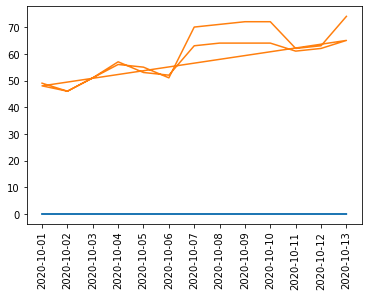

In [51]:
plt.figure()

date_list = ['2020-10-01', '2020-10-02',
       '2020-10-03', '2020-10-04', '2020-10-05', '2020-10-06',
       '2020-10-07', '2020-10-08', '2020-10-09', '2020-10-10',
       '2020-10-11', '2020-10-12', '2020-10-13']

filter_data = cluster_1[cluster_1['date'].isin(date_list)]
x = filter_data['date']
y1 = filter_data['New cases/1000 people'] 
y2 = filter_data['Social distancing index']


plt.plot(x,y1)
plt.plot(x,y2)
plt.xticks(rotation=90)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


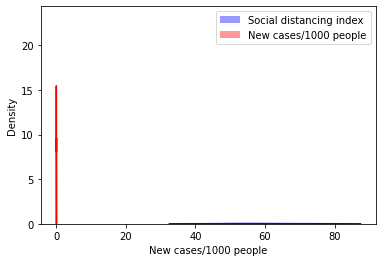

In [52]:
# Method 1: on the same Axis
date_list = ['2020-10-01', '2020-10-02',
       '2020-10-03', '2020-10-04', '2020-10-05', '2020-10-06',
       '2020-10-07', '2020-10-08', '2020-10-09', '2020-10-10',
       '2020-10-11', '2020-10-12', '2020-10-13']

filter_data = cluster_1[cluster_1['date'].isin(date_list)]

sns.distplot( (filter_data['Social distancing index']) , color="blue", label='Social distancing index')
sns.distplot( filter_data['New cases/1000 people'] , color="red", label='New cases/1000 people')
plt.legend()
 
plt.show()


This code is not working. I was trying to plot this link: https://stackoverflow.com/questions/43382051/how-to-plot-min-max-line-plot-in-python-pandas


data = cluster_1.groupby('date')['New cases/1000 people'].agg({'Low Value':'min','High Value':'max','Mean':'mean'})
data.reset_index(inplace=True)

ax  = data.plot(x='date', y='Mean', c='white')
plt.fill_between(x='date',y1='Low Value',y2='High Value', data=data)

### Group Columns

In [135]:
cluster_1.columns

Index(['State', 'Postal Code', 'STFIPS', 'CTFIPS', 'CTNAME',
       'Social distancing index', '% staying home', 'Trips/person',
       '% out-of-county trips', '% out-of-state trips', 'Miles/person',
       'Work trips/person', 'Non-work trips/person', 'New COVID cases',
       'Population', '% change in consumption', 'date', 'Transit mode share',
       '% people older than 60', 'Median income', '% African Americans',
       '% Hispanic Americans', '% Male', 'Population density',
       'Employment density', '# hot spots/1000 people',
       'Hospital beds/1000 people', 'ICUs/1000 people',
       '# contact tracing workers/1000 people', 'New cases/1000 people',
       'Active cases/1000 people', '#days: decreasing COVID cases',
       '% hospital bed utilization', 'Testing capacity',
       'Tests done/1000 people', '% ICU utilization', 'Ventilator shortage',
       'Imported COVID cases', 'COVID exposure/1000 people',
       '#days: decreasing ILI cases', 'Unemployment claims/1000 p

In [136]:
filter_col= ['Social distancing index','% staying home', 'Trips/person', '% out-of-county trips',
       '% out-of-state trips', 'Miles/person', 'Work trips/person',
       'Non-work trips/person','% change in consumption','Transit mode share',
       '% people older than 60', 'Median income', '% African Americans',
       '% Hispanic Americans', '% Male', 'Population density',
       'Employment density', '# hot spots/1000 people',
       'Hospital beds/1000 people', 'ICUs/1000 people',
       '# contact tracing workers/1000 people','% hospital bed utilization', 'Testing capacity',
       'Tests done/1000 people', '% ICU utilization', 'Ventilator shortage',
       'Imported COVID cases', 'COVID exposure/1000 people',
       '#days: decreasing ILI cases', 'Unemployment claims/1000 people',
       'Unemployment rate', '% working from home', 'Cumulative inflation rate','New cases/1000 people']

social_dist= ['CTNAME','Social distancing index','% change in consumption', 'New cases/1000 people']

mobility = ['CTNAME','% staying home', 'Trips/person', '% out-of-county trips',
       '% out-of-state trips', 'Miles/person', 'Work trips/person',
       'Non-work trips/person','Transit mode share',
       '% working from home', 'New cases/1000 people']

demographic = ['CTNAME','% people older than 60', 'Median income', '% African Americans',
       '% Hispanic Americans', '% Male', 'Population density',
       'Employment density','# hot spots/1000 people',
       'Hospital beds/1000 people', 'ICUs/1000 people',
       '# contact tracing workers/1000 people','% hospital bed utilization', 'Testing capacity',
       'Tests done/1000 people', '% ICU utilization', 'Ventilator shortage',
       'Imported COVID cases', 'COVID exposure/1000 people','New cases/1000 people']

employment = ['CTNAME','Unemployment claims/1000 people',
       'Unemployment rate', '% working from home', 'Cumulative inflation rate','New cases/1000 people']

### Correlation Plot

In [153]:
pos_cor_columns = ['CTNAME','Social distancing index','% change in consumption',
                   '% staying home','Trips/person','Work trips/person','% working from home',
                   'Median income','% African Americans', '% Hispanic Americans','% Male','Population density',
                   'Employment density','Hospital beds/1000 people','Testing capacity','Tests done/1000 people',
                   '% ICU utilization','COVID exposure/1000 people',
                    'New cases/1000 people']

#### 1.social_dist

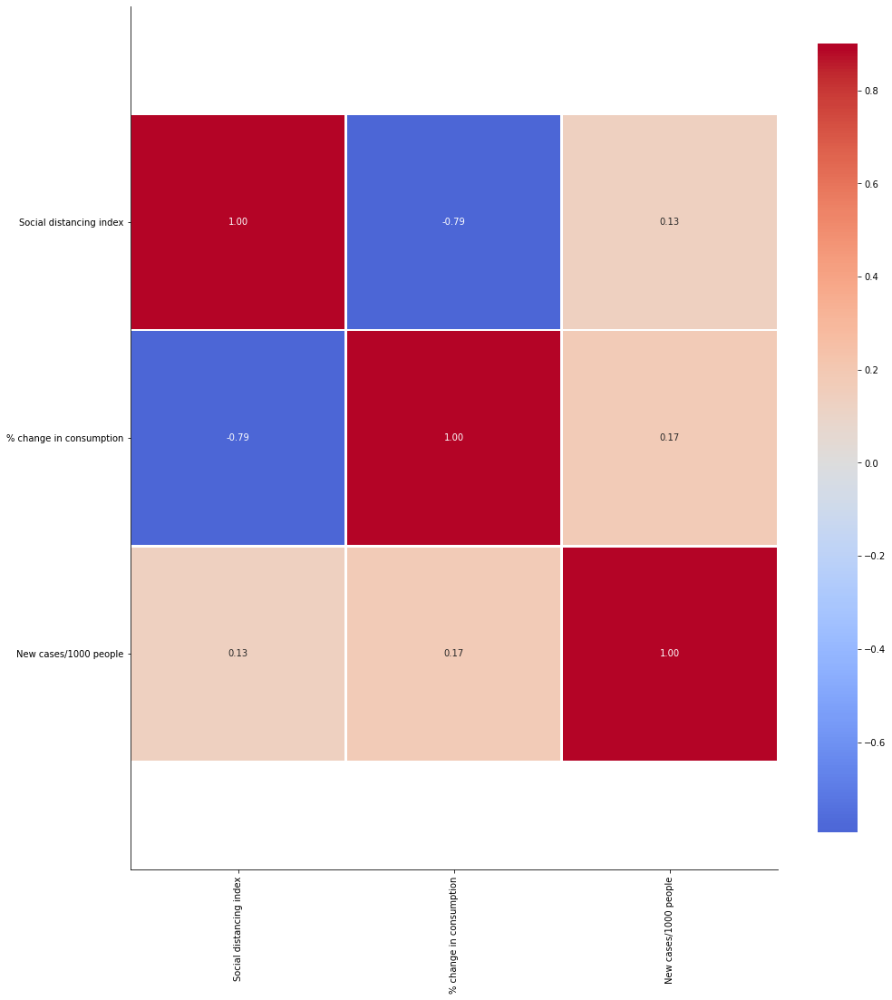

In [138]:
corr = cluster_1[social_dist].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

#### 2.mobility

In [154]:
mobility

['CTNAME',
 '% staying home',
 'Trips/person',
 '% out-of-county trips',
 '% out-of-state trips',
 'Miles/person',
 'Work trips/person',
 'Non-work trips/person',
 'Transit mode share',
 '% working from home',
 'New cases/1000 people']

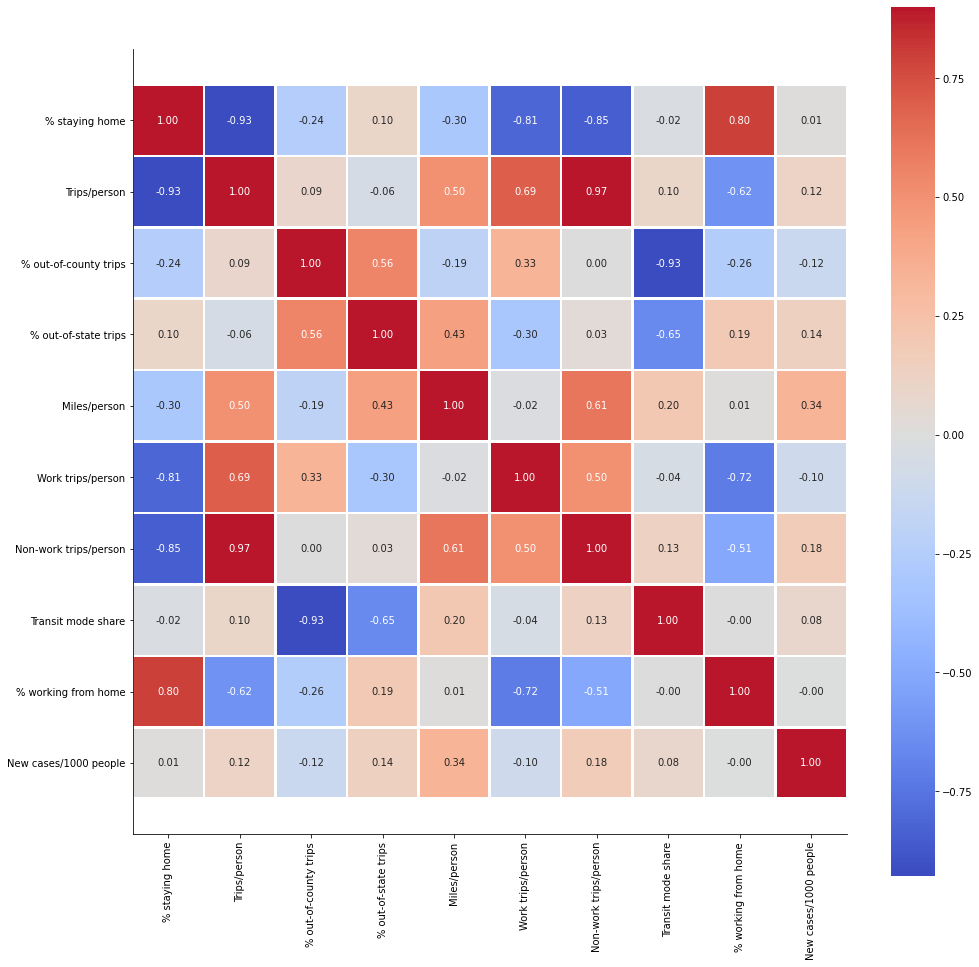

In [139]:
corr = cluster_1[mobility].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

#### 3.demographic

In [157]:
demographic



['CTNAME',
 '% people older than 60',
 'Median income',
 '% African Americans',
 '% Hispanic Americans',
 '% Male',
 'Population density',
 'Employment density',
 '# hot spots/1000 people',
 'Hospital beds/1000 people',
 'ICUs/1000 people',
 '# contact tracing workers/1000 people',
 '% hospital bed utilization',
 'Testing capacity',
 'Tests done/1000 people',
 '% ICU utilization',
 'Ventilator shortage',
 'Imported COVID cases',
 'COVID exposure/1000 people',
 'New cases/1000 people']

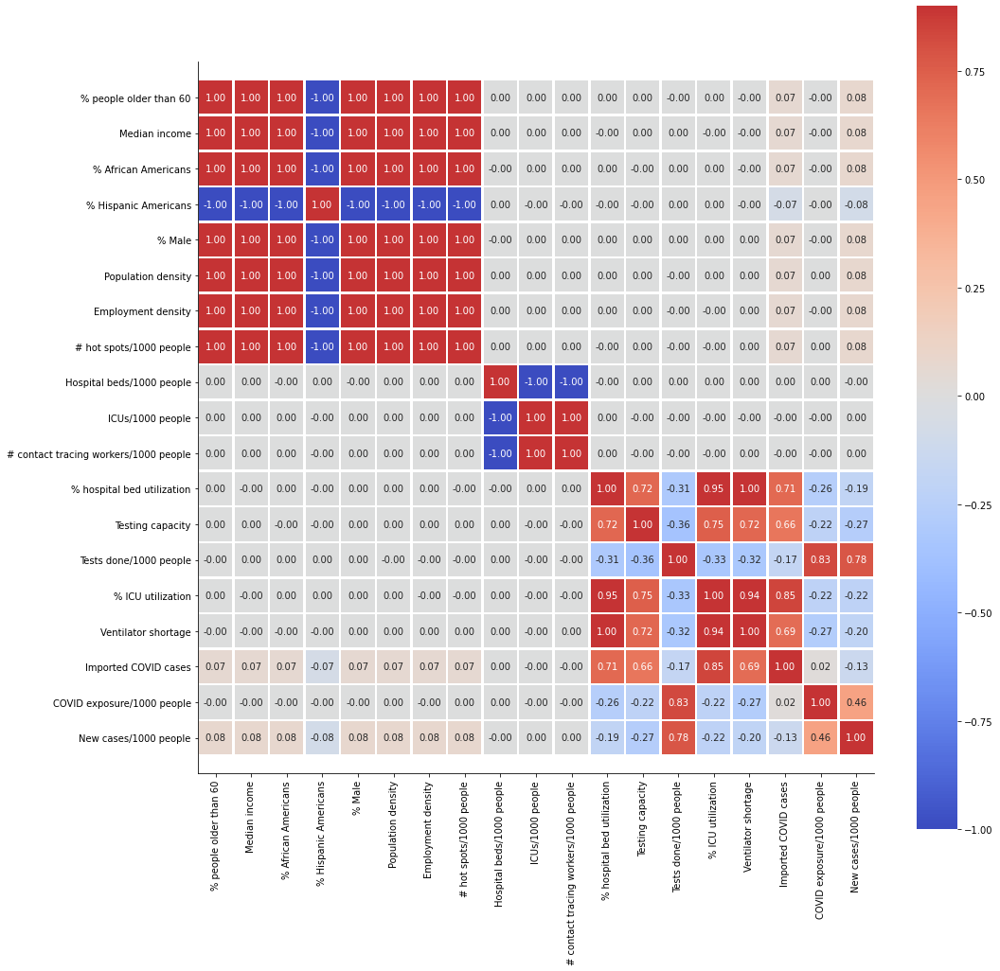

In [140]:
corr = cluster_1[demographic].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

#### 4.employment

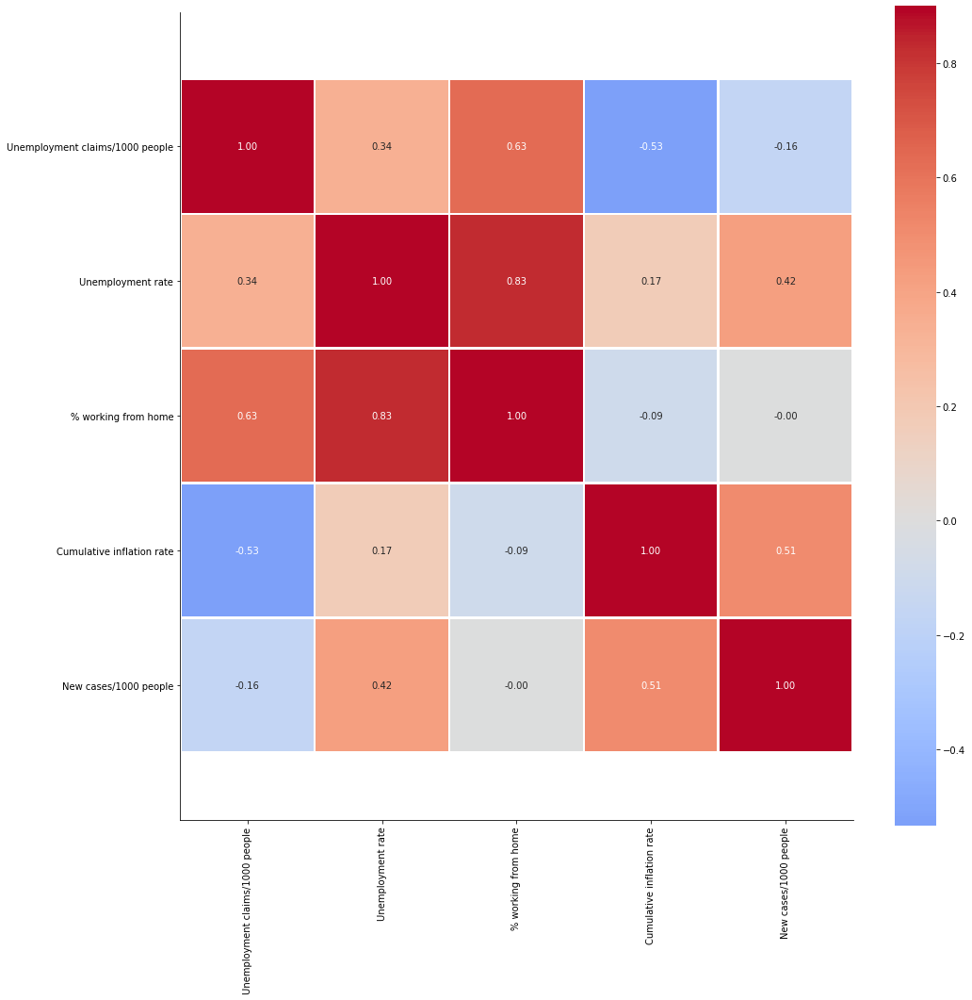

In [141]:
corr = cluster_1[employment].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)

#### 5.Pos_columns

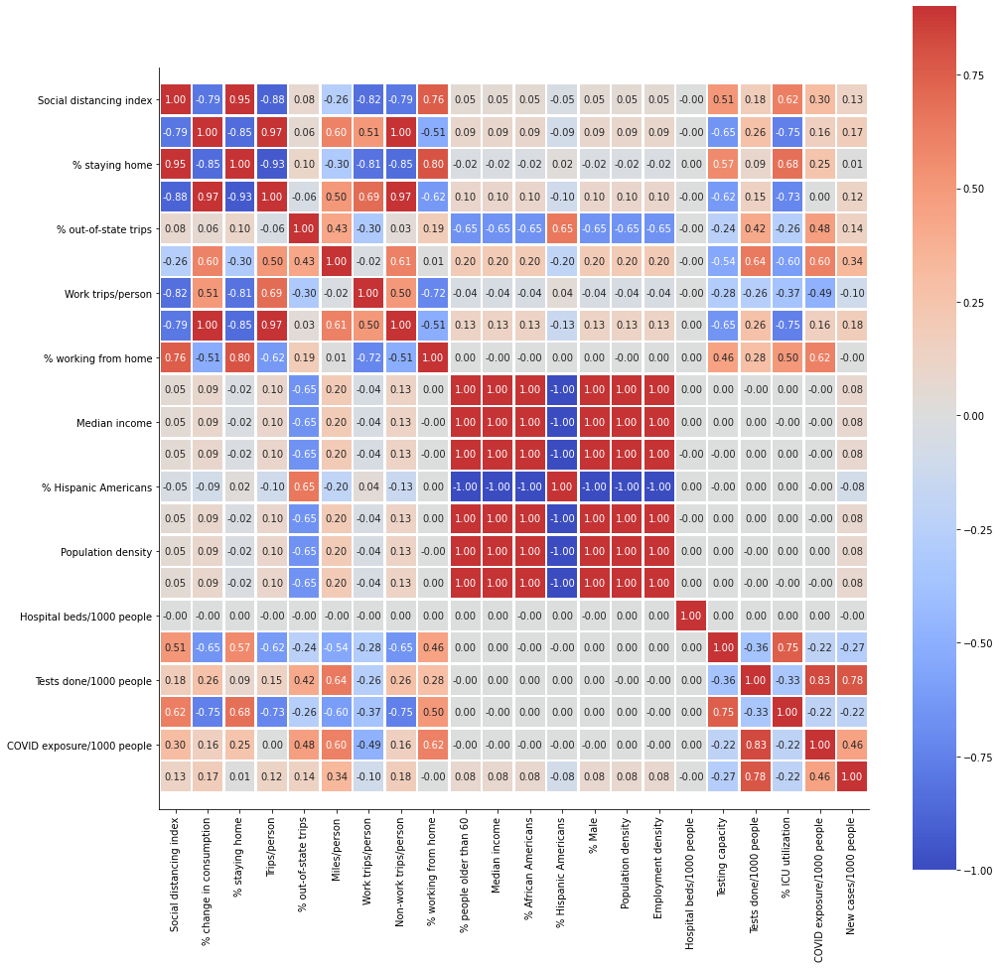

In [160]:
pos_cor_columns = ['CTNAME','Social distancing index','% change in consumption',
                   '% staying home','Trips/person','% out-of-state trips','Miles/person',
                   'Work trips/person','Non-work trips/person','% working from home',
                   '% people older than 60','Median income','% African Americans', '% Hispanic Americans','% Male','Population density',
                   'Employment density','Hospital beds/1000 people','Testing capacity','Tests done/1000 people',
                   '% ICU utilization','COVID exposure/1000 people',
                    'New cases/1000 people']
corr = cluster_1[pos_cor_columns].corr()
g = sns.heatmap(corr, vmax=.9, center=0,
               square=True, linewidths=1.5, cbar_kws={"shrink": .8}, annot=True, fmt='.2f', cmap='coolwarm')
bottom, top = g.get_ylim()
g.set_ylim(bottom + 0.5, top - 0.5)
sns.despine()
g.figure.set_size_inches(16, 20)